In [1]:
import numpy as np
import cupy as cp
from holotomocupy.holo import G, GT
from holotomocupy.shift import S
from holotomocupy.tomo import R, RT
from holotomocupy.chunking import gpu_batch
from holotomocupy.recon_methods import multiPaganin
from holotomocupy.utils import *
from holotomocupy.proc import linear, dai_yuan
import sys

%matplotlib inline
# !jupyter nbconvert --to script rec_reprojection_codes.ipynb

astropy module not found
olefile module not found


# Init data sizes and parametes of the PXM of ID16A

In [2]:
n = 256  # object size in each dimension

ntheta = 180  # number of angles (rotations)
noise = 0
z1c = -12e-3
# thickness of the coded aperture
code_thickness = 1.5e-6 #in m
# feature size
ill_feature_size = 1e-6 #in m

# ntheta = int(sys.argv[1])  # number of angles (rotations)
# noise = int(sys.argv[2])#sys.argv[2]=='True'
# z1c = float(sys.argv[3])  # positions of the code and the probe for reconstruction


center = n/2 # rotation axis
theta = cp.linspace(0, np.pi, ntheta,endpoint=False).astype('float32')  # projection angles
npos = 1  # number of code positions
detector_pixelsize = 3e-6/2
energy = 33.35  # [keV] xray energy
wavelength = 1.2398419840550367e-09/energy  # [m] wave length
focusToDetectorDistance = 1.28  # [m]
sx0 = 3.7e-4
z1 = 4.584e-3-sx0# np.array([4.584e-3, 4.765e-3, 5.488e-3, 6.9895e-3])[:npos]-sx0
z1 = np.tile(z1, [npos])
z2 = focusToDetectorDistance-z1
distances = (z1*z2)/focusToDetectorDistance
magnifications = focusToDetectorDistance/z1
voxelsize = detector_pixelsize/magnifications[0]*2048/n  # object voxel size
norm_magnifications = magnifications/magnifications[0]
# scaled propagation distances due to magnified probes
distances = distances*norm_magnifications**2

# magnification when propagating from the probe plane to the detector
magnifications2 = np.abs(z1/z1c)
distances2 = (z1-z1c)/(z1c/z1)#magnifications2
# allow padding if there are shifts of the probe
pad = n//8
# sample size after demagnification
ne = n+2*pad

show = True

flg = f'{n}_{ntheta}_{npos}_{z1c}_{noise}_code'
# print(magnifications2,norm_magnifications)
# print(distances2,distances22)

## Read data

In [3]:
data00 = np.zeros([ntheta, npos, n, n], dtype='float32')
ref0 = np.zeros([1, npos, n, n], dtype='float32')
print(f'/data2/vnikitin/coded_apertures_new3/data/data_{0}_{flg}.tiff')
for k in range(npos):
    data00[:, k] = read_tiff(f'/data2/vnikitin/coded_apertures_new3/data/data_{k}_{flg}.tiff')[:ntheta]
for k in range(npos):
    ref0[:, k] = read_tiff(f'/data2/vnikitin/coded_apertures_new3/data/ref_{k}_{flg}.tiff')[:]
code = np.load(f'/data2/vnikitin/coded_apertures_new3/data/code_{flg}.npy')
shifts_code = np.load(f'/data2/vnikitin/coded_apertures_new3/data/shifts_code_{flg}.npy')[:, :npos]

# code = np.pad(code,((0,0),(ne//2,ne//2),(ne//2,ne//2)),'edge')
print(code.shape)

/data2/vnikitin/coded_apertures_new3/data/data_0_256_180_1_-0.012_0_code.tiff
(1, 640, 640)


# Construct operators


In [4]:
@gpu_batch
def _fwd_holo(psi, shifts_code, code, prb):
    #print(psi.shape)
    prb = cp.array(prb)
    code = cp.array(code)

    data = cp.zeros([psi.shape[0], npos, n, n], dtype='complex64')
    for i in range(npos):
        psir = psi.copy()
        prbr = cp.tile(prb, [psi.shape[0], 1, 1])
        coder = cp.tile(code, [psi.shape[0], 1, 1])
        
        # shift and crop the code 
        coder = S(coder, shifts_code[:, i])
        coder = coder[:, coder.shape[1]//2-n//2-pad:coder.shape[1]//2+n//2+pad, coder.shape[1]//2-n//2-pad:coder.shape[1]//2+n//2+pad]
        # multiply by the probe
        coder *= prbr

        # propagate both to the sample plane
        coder = G(coder, wavelength, voxelsize, distances2[i])
        
        # multiply by the sample
        psir *= coder           

        # propagate all to the detector
        psir = G(psir, wavelength, voxelsize, distances[i])

        # unpad
        data[:, i] = psir[:, psir.shape[1]//2-n//2:psir.shape[1]//2+n//2, psir.shape[1]//2-n//2:psir.shape[1]//2+n//2]
        
    return data

@gpu_batch
def _adj_holo(data, shifts_code, prb, code):
    prb = cp.array(prb)
    code = cp.array(code)
    shifts_code = cp.array(shifts_code)
    psi = cp.zeros([data.shape[0], ne, ne], dtype='complex64')
    for j in range(npos):
        prbr = cp.tile(prb,[psi.shape[0],1,1])        
        coder = cp.tile(code,[psi.shape[0],1,1])
        psir = cp.pad(data[:, j], ((0, 0), (pad, pad), (pad, pad)))
        psir = GT(psir, wavelength, voxelsize, distances[j])
        coder = S(coder, shifts_code[:,j])            
        coder = coder[:,ne-n//2-pad:ne+n//2+pad,ne-n//2-pad:ne+n//2+pad]        
        coder *= prbr
        coder = G(coder, wavelength, voxelsize, distances2[j])
        psir *= cp.conj(coder)
        psi += psir
    return psi

@gpu_batch
def _adj_holo_prb(data, shifts_code, psi, code):
    psi = cp.array(psi)
    code = cp.array(code)
    shifts_code = cp.array(shifts_code)       
    prb = cp.zeros([data.shape[0], n+2*pad, n+2*pad], dtype='complex64')
    for j in range(npos):
        prbr = np.pad(data[:, j], ((0, 0), (pad, pad), (pad, pad)))
        coder = cp.tile(code,[psi.shape[0],1,1])
        psir = psi.copy()
        prbr = GT(prbr, wavelength, voxelsize, distances[j])
        prbr*=cp.conj(psir)
        prbr = GT(prbr, wavelength, voxelsize, distances2[j])
        coder = S(coder, shifts_code[:,j])            
        coder = coder[:, coder.shape[1]//2-n//2-pad:coder.shape[1]//2+n//2+pad, coder.shape[1]//2-n//2-pad:coder.shape[1]//2+n//2+pad]
        prbr *= cp.conj(coder)
        prb += prbr
    return prb

def fwd_holo(psi, prb):
    return _fwd_holo(psi, shifts_code, code, prb)
def adj_holo(data, prb):
    return _adj_holo(data, shifts_code, prb, code)
def adj_holo_prb(data, psi):
    ''' Adjoint Holography operator '''
    return np.sum(_adj_holo_prb(data, shifts_code, psi, code), axis=0)[np.newaxis]

# adjoint tests
data = data00.copy()
arr1 = cp.pad(cp.array(data[:, 0]+1j*data[:, 0]).astype('complex64'),
              ((0, 0), (ne//2-n//2, ne//2-n//2), (ne//2-n//2, ne//2-n//2)), 'symmetric')

prb1 = cp.ones([1,n+2*pad,n+2*pad],dtype='complex64')
code = cp.array(code)
shifts_code = cp.array(shifts_code)
arr2 = fwd_holo(arr1, prb1)
arr3 = adj_holo(arr2, prb1)
arr4 = adj_holo_prb(arr2, arr1)

print(f'{cp.sum(arr1*cp.conj(arr3))}==\n{cp.sum(arr2*cp.conj(arr2))}')
print(f'{cp.sum(prb1*cp.conj(arr4))}==\n{cp.sum(arr2*cp.conj(arr2))}')

arr1 = arr1.swapaxes(0,1)
a = RT(arr1,theta,ne//2)
b = R(a,theta,ne//2)
c = RT(b,theta,ne//2)
print(f'{cp.sum(arr1*cp.conj(b))}==\n{cp.sum(a*cp.conj(a))}')
print(f'{cp.sum(a*cp.conj(a))}==\n{cp.sum(a*cp.conj(c))}')

(23262804-0.0273895263671875j)==
(23262802+0.00010152903996640816j)
(23262802-0.10693359375j)==
(23262802+0.00010152903996640816j)
(34657732+4.032237529754639j)==
(34657728+5.108956975163892e-05j)
(34657728+5.108956975163892e-05j)==
(35025964+1.2432857751846313j)


### Propagate the code to the detector and divide all data by it

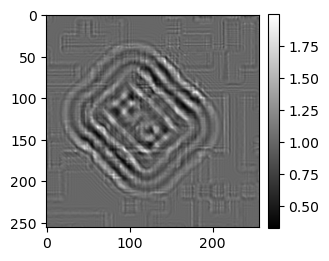

In [5]:
psi = cp.ones([ntheta,ne,ne],dtype='complex64')
prb = cp.ones([1,n+2*pad,n+2*pad],dtype='complex64')
ref0 = cp.array(ref0)
data00 = cp.array(data00)
d = cp.abs(fwd_holo(psi,prb))**2

rdata = data00/d/ref0
mshow((rdata)[0,0],show)

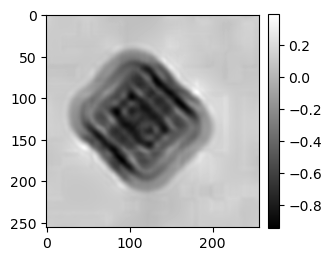

In [6]:
# distances should not be normalized
distances_pag = (distances/norm_magnifications**2)[:npos]
recMultiPaganin = np.exp(1j*multiPaganin(rdata,
                         distances_pag, wavelength, voxelsize,  100, 1e-12))
mshow(np.angle(recMultiPaganin[0]),show)

#### Exponential and logarithm functions for the Transmittance function

In [7]:

def exptomo(psi):
    """Exp representation of projections"""
    return np.exp(1j*psi * voxelsize * 2*cp.pi / wavelength*np.sqrt(ne*ntheta))
    
def logtomo(psi):
    """Log representation of projections, -i/\nu log(psi)"""
    res = psi.copy()
    res[np.abs(psi) < 1e-32] = 1e-32
    res = np.log(res)
    res = -1j * wavelength / (2*cp.pi) * res / voxelsize/np.sqrt(ne*ntheta)
    return res

# Operators for the flat field

In [8]:
@gpu_batch
def _fwd_holo0(prb):
    data = cp.zeros([1, npos, n, n], dtype='complex64')
    for j in range(npos):
        # propagate illumination
        data[:, j] = G(prb, wavelength, voxelsize, distances[0])[:, pad:n+pad, pad:n+pad]
    return data

def fwd_holo0(prb):
    return _fwd_holo0(prb)

@gpu_batch
def _adj_holo0(data):
    prb = cp.zeros([1, n+2*pad, n+2*pad], dtype='complex64')
    for j in range(npos):
        # ill shift for each acquisition
        prbr = cp.pad(data[:, j], ((0, 0), (pad, pad), (pad, pad)))
        # propagate illumination
        prbr = GT(prbr, wavelength, voxelsize, distances[0])
        # ill shift for each acquisition
        prb += prbr
    return prb

def adj_holo0(data):
    return _adj_holo0(data)


# adjoint test
data = data[0, :].copy()
ref = ref0.copy()
prb1 = cp.array(ref[0, :1]+1j*ref[0, :1]).astype('complex64')
prb1 = cp.pad(prb1, ((0, 0), (pad, pad), (pad, pad)))
arr2 = fwd_holo0(prb1)
arr3 = adj_holo0(arr2)


print(f'{np.sum(prb1*np.conj(arr3))}==\n{np.sum(arr2*np.conj(arr2))}')

(131381.859375-0.0037103667855262756j)==
(131381.859375-1.3822377695760224e-06j)


In [9]:
def line_search(minf, gamma, fu, fd):
    """ Line search for the step sizes gamma"""
    while(minf(fu)-minf(fu+gamma*fd) < 0 and gamma > 1e-3):
        gamma *= 0.5
    if(gamma <= 1e-3):  # direction not found
        #print(f'{fu.shape} r no direction')
        gamma = 0
    return gamma

def cg_tomo(data, init, pars):
    """Conjugate gradients method for tomogarphy"""
    # minimization functional    
    @gpu_batch
    def _minf(Ru,data):
        res = cp.empty(data.shape[0],dtype='float32')
        for k in range(data.shape[0]):
            res[k] = np.linalg.norm(Ru[k]-data[k])**2
        return res
    
    def minf(Ru):
        res = np.sum(_minf(Ru,data))
        return res
    
    u = init.copy()
    center_pad = u.shape[-1]//2
    for i in range(pars['titer']):
        fu = R(u,theta,center_pad)
        grad = RT(fu-data,theta,center_pad)#/np.float32(np.prod(data.shape[1:]))
        # Dai-Yuan direction
        if i == 0:
            d = -grad
        else:
            d = dai_yuan(d,grad,grad0)

        grad0 = grad
        fd = R(d, theta, center_pad)
        gamma = line_search(minf, pars['gammau'], fu, fd)
        u = linear(u,d,1,gamma)   
        # print('t',i,minf(R(u,theta,center_pad)))
    return u


0), float(gammah)=1.1991328001022339 err=7.43039e+03


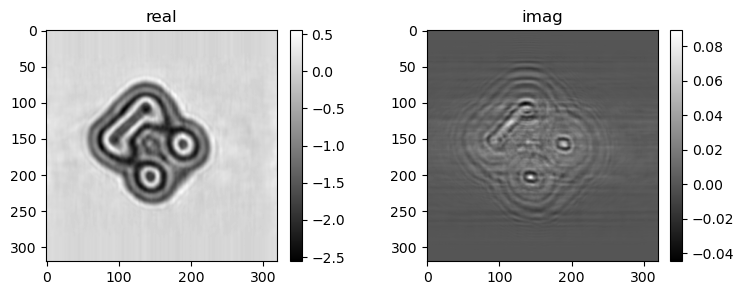

1), float(gammah)=4.248715877532959 err=4.98639e+03
2), float(gammah)=0.9909743070602417 err=3.68818e+03
3), float(gammah)=2.0263969898223877 err=2.44523e+03
4), float(gammah)=1.0529638528823853 err=1.78444e+03
5), float(gammah)=1.8366409540176392 err=1.42903e+03
6), float(gammah)=1.55471670627594 err=1.07476e+03
7), float(gammah)=2.145246744155884 err=8.45971e+02
8), float(gammah)=1.3688344955444336 err=6.99306e+02
9), float(gammah)=1.908400535583496 err=5.89278e+02
10), float(gammah)=1.2580183744430542 err=4.97868e+02
11), float(gammah)=1.6459970474243164 err=4.31938e+02
12), float(gammah)=1.5369614362716675 err=3.78450e+02
13), float(gammah)=1.7911677360534668 err=3.35009e+02
14), float(gammah)=1.565310001373291 err=2.96568e+02
15), float(gammah)=1.5102689266204834 err=2.69573e+02
16), float(gammah)=1.602917194366455 err=2.45398e+02
17), float(gammah)=1.6271647214889526 err=2.25281e+02
18), float(gammah)=1.7625528573989868 err=2.06708e+02
19), float(gammah)=1.5722776651382446 err=1.

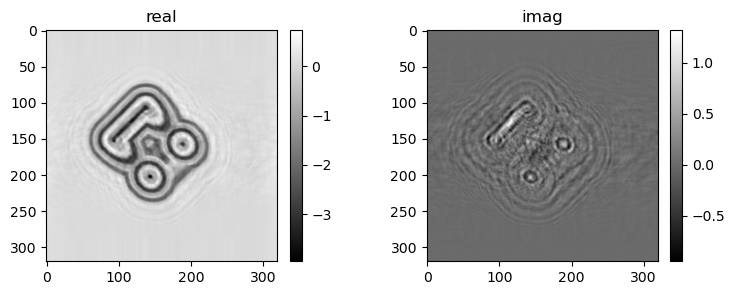

33), float(gammah)=2.114030599594116 err=8.84844e+01
34), float(gammah)=1.7144423723220825 err=8.32109e+01
35), float(gammah)=1.961578607559204 err=7.88803e+01
36), float(gammah)=1.6919296979904175 err=7.40729e+01
37), float(gammah)=1.611309289932251 err=7.05907e+01
38), float(gammah)=1.9200080633163452 err=6.58233e+01
39), float(gammah)=1.3975955247879028 err=6.26079e+01
40), float(gammah)=2.2836861610412598 err=5.88099e+01
41), float(gammah)=1.409105896949768 err=5.56101e+01
42), float(gammah)=1.8450120687484741 err=5.27748e+01
43), float(gammah)=1.4936549663543701 err=4.99987e+01
44), float(gammah)=1.8791841268539429 err=4.74322e+01
45), float(gammah)=1.6514331102371216 err=4.47863e+01
46), float(gammah)=2.0437302589416504 err=4.26372e+01
47), float(gammah)=1.7376357316970825 err=4.02150e+01
48), float(gammah)=1.682151198387146 err=3.85262e+01
49), float(gammah)=1.7808398008346558 err=3.67847e+01
50), float(gammah)=1.55609929561615 err=3.51551e+01
51), float(gammah)=1.57230257987976

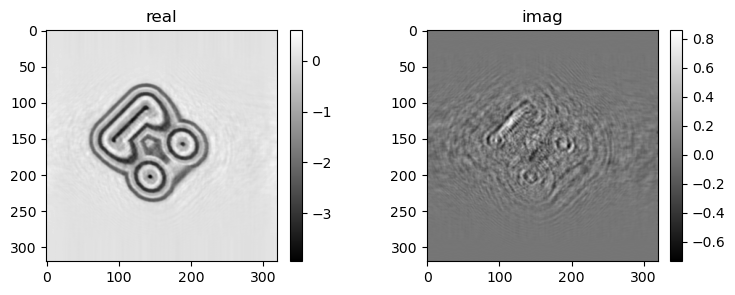

65), float(gammah)=1.689229965209961 err=1.98369e+01
66), float(gammah)=2.054107904434204 err=1.90349e+01
67), float(gammah)=1.547200322151184 err=1.84472e+01
68), float(gammah)=2.1690218448638916 err=1.77477e+01
69), float(gammah)=1.4406392574310303 err=1.71656e+01
70), float(gammah)=1.722445011138916 err=1.66073e+01
71), float(gammah)=1.631495714187622 err=1.60159e+01
72), float(gammah)=1.9101362228393555 err=1.54624e+01
73), float(gammah)=1.7599742412567139 err=1.49025e+01
74), float(gammah)=1.9501605033874512 err=1.43898e+01
75), float(gammah)=1.7600654363632202 err=1.38661e+01
76), float(gammah)=1.6571903228759766 err=1.34377e+01
77), float(gammah)=1.7980858087539673 err=1.29656e+01
78), float(gammah)=1.6078624725341797 err=1.25651e+01
79), float(gammah)=1.7245962619781494 err=1.21311e+01
80), float(gammah)=1.5168095827102661 err=1.17830e+01
81), float(gammah)=2.108588933944702 err=1.13729e+01
82), float(gammah)=1.5505701303482056 err=1.10028e+01
83), float(gammah)=1.9754663705825

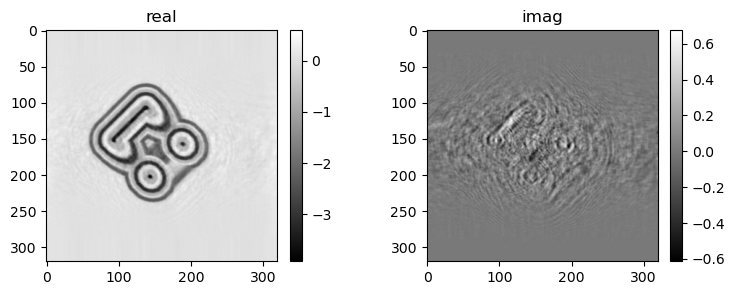

97), float(gammah)=1.742991328239441 err=7.10468e+00
98), float(gammah)=1.7329719066619873 err=6.92175e+00
99), float(gammah)=1.541724443435669 err=6.74303e+00
100), float(gammah)=1.6603631973266602 err=6.57660e+00
101), float(gammah)=1.9031075239181519 err=6.38216e+00
102), float(gammah)=1.801662802696228 err=6.21901e+00
103), float(gammah)=2.1297736167907715 err=6.03166e+00
104), float(gammah)=1.6495354175567627 err=5.88633e+00
105), float(gammah)=2.022540330886841 err=5.71678e+00
106), float(gammah)=1.3458024263381958 err=5.58561e+00
107), float(gammah)=2.0410237312316895 err=5.43150e+00
108), float(gammah)=1.5287624597549438 err=5.28797e+00
109), float(gammah)=2.0297491550445557 err=5.15875e+00
110), float(gammah)=1.6345785856246948 err=5.01350e+00
111), float(gammah)=1.7569632530212402 err=4.89980e+00
112), float(gammah)=1.715208888053894 err=4.76273e+00
113), float(gammah)=1.6064010858535767 err=4.65658e+00
114), float(gammah)=2.0610010623931885 err=4.52387e+00
115), float(gammah

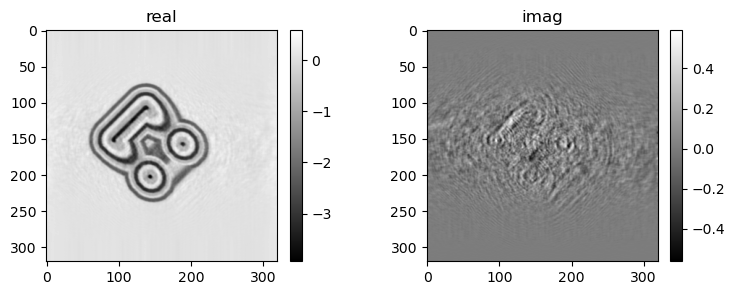

129), float(gammah)=1.7447760105133057 err=3.18089e+00
130), float(gammah)=1.7123897075653076 err=3.11425e+00
131), float(gammah)=1.9910550117492676 err=3.03797e+00
132), float(gammah)=1.772055745124817 err=2.97536e+00
133), float(gammah)=1.965851902961731 err=2.90539e+00
134), float(gammah)=1.366713285446167 err=2.85142e+00
135), float(gammah)=2.028770923614502 err=2.78547e+00
136), float(gammah)=1.7086888551712036 err=2.72519e+00
137), float(gammah)=1.9597755670547485 err=2.66605e+00
138), float(gammah)=1.567236304283142 err=2.61129e+00
139), float(gammah)=1.6527190208435059 err=2.56157e+00
140), float(gammah)=1.7311068773269653 err=2.50268e+00
141), float(gammah)=1.8172837495803833 err=2.45299e+00
142), float(gammah)=2.052818775177002 err=2.39422e+00
143), float(gammah)=1.6706151962280273 err=2.34874e+00
144), float(gammah)=2.1830334663391113 err=2.29269e+00
145), float(gammah)=1.477419137954712 err=2.25219e+00
146), float(gammah)=1.9037621021270752 err=2.20428e+00
147), float(gamma

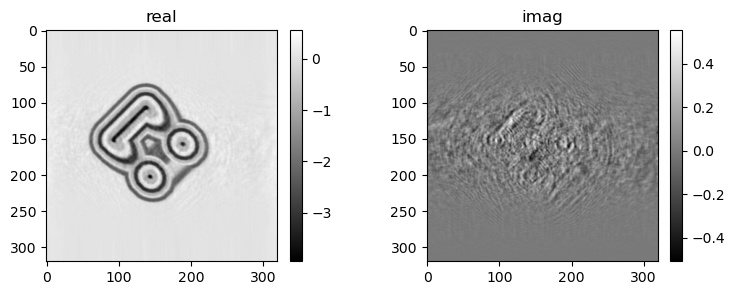

161), float(gammah)=1.8886597156524658 err=1.64254e+00
162), float(gammah)=1.8183133602142334 err=1.60810e+00
163), float(gammah)=1.919368028640747 err=1.57946e+00
164), float(gammah)=1.8855749368667603 err=1.54668e+00
165), float(gammah)=1.69138765335083 err=1.52081e+00
166), float(gammah)=1.6650866270065308 err=1.49291e+00
167), float(gammah)=1.5784010887145996 err=1.46759e+00
168), float(gammah)=1.8740304708480835 err=1.43872e+00
169), float(gammah)=1.7421188354492188 err=1.41512e+00
170), float(gammah)=1.9776644706726074 err=1.38517e+00
171), float(gammah)=1.5381500720977783 err=1.36372e+00
172), float(gammah)=2.1836893558502197 err=1.33542e+00
173), float(gammah)=1.511539101600647 err=1.31412e+00
174), float(gammah)=2.1506595611572266 err=1.28815e+00
175), float(gammah)=1.3960751295089722 err=1.26737e+00
176), float(gammah)=1.8515965938568115 err=1.24615e+00
177), float(gammah)=1.647599458694458 err=1.22257e+00
178), float(gammah)=1.8224773406982422 err=1.20319e+00
179), float(gam

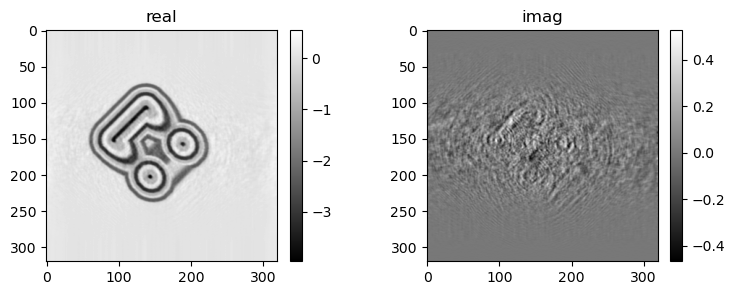

193), float(gammah)=1.7906943559646606 err=9.27687e-01
194), float(gammah)=1.6545889377593994 err=9.12218e-01
195), float(gammah)=1.4701659679412842 err=8.99055e-01
196), float(gammah)=1.9800667762756348 err=8.83066e-01
197), float(gammah)=1.826736330986023 err=8.68910e-01
198), float(gammah)=2.071117639541626 err=8.53137e-01
199), float(gammah)=1.679200530052185 err=8.40424e-01
200), float(gammah)=1.798814296722412 err=8.26655e-01
201), float(gammah)=1.5818811655044556 err=8.14106e-01
202), float(gammah)=1.9079867601394653 err=8.01049e-01
203), float(gammah)=1.6155093908309937 err=7.87947e-01
204), float(gammah)=1.8337780237197876 err=7.76327e-01
205), float(gammah)=1.8667856454849243 err=7.62634e-01
206), float(gammah)=1.511934518814087 err=7.52361e-01
207), float(gammah)=1.8395586013793945 err=7.39989e-01
208), float(gammah)=1.5855003595352173 err=7.28664e-01
209), float(gammah)=2.234290361404419 err=7.15903e-01
210), float(gammah)=1.6242845058441162 err=7.05564e-01
211), float(gamm

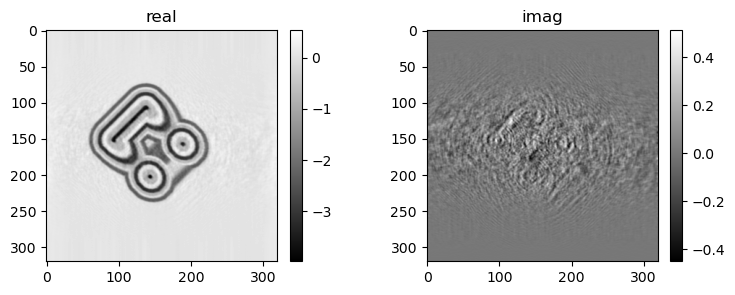

225), float(gammah)=1.4804984331130981 err=5.60228e-01
226), float(gammah)=2.115677833557129 err=5.51411e-01
227), float(gammah)=1.5575075149536133 err=5.43069e-01
228), float(gammah)=2.0257439613342285 err=5.35177e-01
229), float(gammah)=1.5979955196380615 err=5.26981e-01
230), float(gammah)=1.6815760135650635 err=5.20146e-01
231), float(gammah)=1.9144190549850464 err=5.11272e-01
232), float(gammah)=1.777095913887024 err=5.04449e-01
233), float(gammah)=2.042046070098877 err=4.95805e-01
234), float(gammah)=1.522611379623413 err=4.89813e-01
235), float(gammah)=1.8402624130249023 err=4.82218e-01
236), float(gammah)=1.4573088884353638 err=4.76057e-01
237), float(gammah)=2.1262600421905518 err=4.68475e-01
238), float(gammah)=1.626146912574768 err=4.61777e-01
239), float(gammah)=2.2959847450256348 err=4.54555e-01
240), float(gammah)=1.5683999061584473 err=4.48072e-01
241), float(gammah)=2.033409833908081 err=4.41705e-01
242), float(gammah)=1.6472686529159546 err=4.35184e-01
243), float(gamm

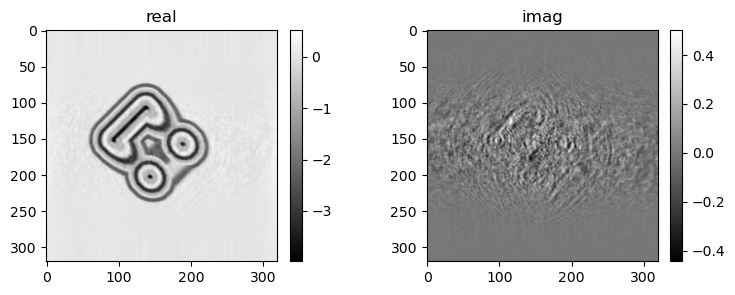

257), float(gammah)=1.7459886074066162 err=3.52636e-01
258), float(gammah)=2.037423610687256 err=3.47810e-01
259), float(gammah)=1.6813743114471436 err=3.42765e-01
260), float(gammah)=1.8681988716125488 err=3.38296e-01
261), float(gammah)=1.7987102270126343 err=3.33329e-01
262), float(gammah)=1.6707334518432617 err=3.29296e-01
263), float(gammah)=1.825999140739441 err=3.24503e-01
264), float(gammah)=1.478907585144043 err=3.20643e-01
265), float(gammah)=2.0075364112854004 err=3.15921e-01
266), float(gammah)=1.5141258239746094 err=3.12047e-01
267), float(gammah)=2.1441967487335205 err=3.07440e-01
268), float(gammah)=1.6940531730651855 err=3.03171e-01
269), float(gammah)=2.0533816814422607 err=2.99046e-01
270), float(gammah)=1.616036295890808 err=2.94993e-01
271), float(gammah)=1.8261981010437012 err=2.91332e-01
272), float(gammah)=1.7141783237457275 err=2.87150e-01
273), float(gammah)=1.4368265867233276 err=2.83873e-01
274), float(gammah)=2.2445449829101562 err=2.79572e-01
275), float(ga

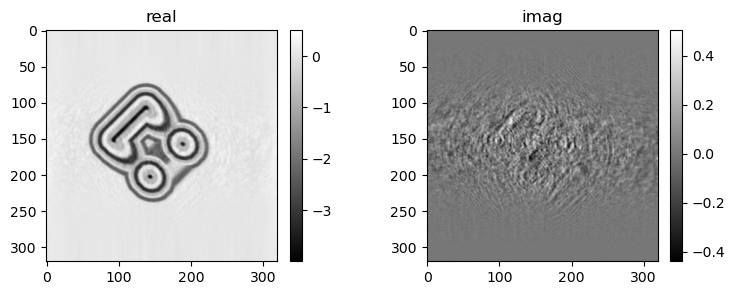

289), float(gammah)=2.146435499191284 err=2.28711e-01
290), float(gammah)=1.496850609779358 err=2.25900e-01
291), float(gammah)=1.7884783744812012 err=2.23200e-01
292), float(gammah)=1.5596510171890259 err=2.20240e-01
293), float(gammah)=1.9631986618041992 err=2.17395e-01
294), float(gammah)=1.8184165954589844 err=2.14491e-01
295), float(gammah)=1.8772947788238525 err=2.11852e-01
296), float(gammah)=1.617721438407898 err=2.09086e-01
297), float(gammah)=1.7390923500061035 err=2.06608e-01
298), float(gammah)=1.8982188701629639 err=2.03704e-01
299), float(gammah)=1.5984876155853271 err=2.01441e-01
300), float(gammah)=2.0134129524230957 err=1.98543e-01
301), float(gammah)=1.6282246112823486 err=1.96361e-01
302), float(gammah)=1.9733736515045166 err=1.93540e-01
303), float(gammah)=1.382407784461975 err=1.91529e-01
304), float(gammah)=2.1174862384796143 err=1.88797e-01
305), float(gammah)=1.4828635454177856 err=1.86653e-01
306), float(gammah)=2.2054567337036133 err=1.84093e-01
307), float(ga

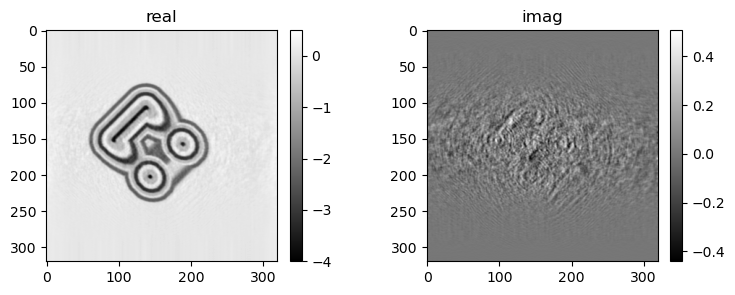

321), float(gammah)=1.784662127494812 err=1.52706e-01
322), float(gammah)=2.0057694911956787 err=1.50586e-01
323), float(gammah)=1.6164793968200684 err=1.48969e-01
324), float(gammah)=1.7571823596954346 err=1.47093e-01
325), float(gammah)=1.5068390369415283 err=1.45484e-01
326), float(gammah)=2.1889560222625732 err=1.43472e-01
327), float(gammah)=1.704692006111145 err=1.41802e-01
328), float(gammah)=2.2191829681396484 err=1.39833e-01
329), float(gammah)=1.5843275785446167 err=1.38330e-01
330), float(gammah)=1.8743280172348022 err=1.36589e-01
331), float(gammah)=1.4701173305511475 err=1.35072e-01
332), float(gammah)=1.9432661533355713 err=1.33419e-01
333), float(gammah)=1.5575300455093384 err=1.31787e-01
334), float(gammah)=1.95096755027771 err=1.30271e-01
335), float(gammah)=1.8721511363983154 err=1.28522e-01
336), float(gammah)=1.8322608470916748 err=1.27088e-01
337), float(gammah)=1.9691545963287354 err=1.25380e-01
338), float(gammah)=1.4360408782958984 err=1.24144e-01
339), float(ga

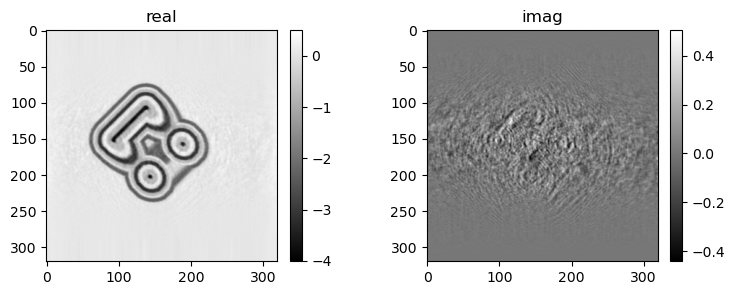

353), float(gammah)=1.479225516319275 err=1.03898e-01
354), float(gammah)=1.9774706363677979 err=1.02578e-01
355), float(gammah)=1.595599889755249 err=1.01419e-01
356), float(gammah)=2.39505672454834 err=1.00081e-01
357), float(gammah)=1.6101224422454834 err=9.89156e-02
358), float(gammah)=2.0487091541290283 err=9.77674e-02
359), float(gammah)=1.5963788032531738 err=9.65785e-02
360), float(gammah)=1.7161675691604614 err=9.55856e-02
361), float(gammah)=1.6665728092193604 err=9.43695e-02
362), float(gammah)=1.6596543788909912 err=9.34032e-02
363), float(gammah)=2.1726698875427246 err=9.20920e-02
364), float(gammah)=1.7254942655563354 err=9.11532e-02
365), float(gammah)=2.0487747192382812 err=8.99039e-02
366), float(gammah)=1.5666786432266235 err=8.90290e-02
367), float(gammah)=1.9638311862945557 err=8.78833e-02
368), float(gammah)=1.3874057531356812 err=8.70095e-02
369), float(gammah)=2.2317991256713867 err=8.58804e-02
370), float(gammah)=1.5891696214675903 err=8.49189e-02
371), float(ga

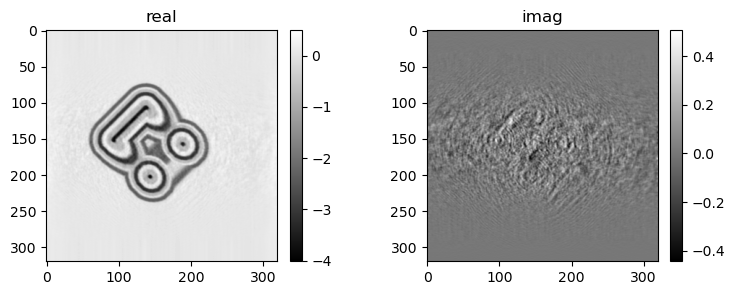

385), float(gammah)=1.7480987310409546 err=7.14939e-02
386), float(gammah)=1.9382625818252563 err=7.07145e-02
387), float(gammah)=1.6846134662628174 err=6.98495e-02
388), float(gammah)=1.6101529598236084 err=6.91857e-02
389), float(gammah)=1.8351131677627563 err=6.83163e-02
390), float(gammah)=1.5168378353118896 err=6.76609e-02
391), float(gammah)=2.2000744342803955 err=6.67668e-02
392), float(gammah)=1.4879379272460938 err=6.61001e-02
393), float(gammah)=2.3323521614074707 err=6.52653e-02
394), float(gammah)=1.4470595121383667 err=6.45720e-02
395), float(gammah)=1.8603273630142212 err=6.38989e-02
396), float(gammah)=1.6994099617004395 err=6.30903e-02
397), float(gammah)=1.9603404998779297 err=6.24336e-02
398), float(gammah)=1.8815851211547852 err=6.16474e-02
399), float(gammah)=1.6293493509292603 err=6.10606e-02
400), float(gammah)=1.7719396352767944 err=6.03251e-02
401), float(gammah)=1.4477977752685547 err=5.97517e-02
402), float(gammah)=2.2533204555511475 err=5.89831e-02
403), floa

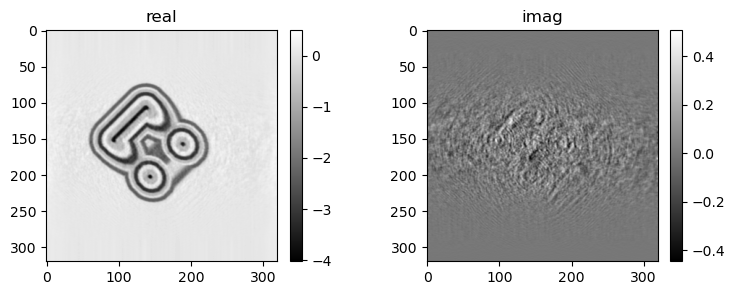

417), float(gammah)=1.883812427520752 err=4.99322e-02
418), float(gammah)=1.434184193611145 err=4.94664e-02
419), float(gammah)=2.2084732055664062 err=4.88415e-02
420), float(gammah)=1.5263888835906982 err=4.83484e-02
421), float(gammah)=2.082160472869873 err=4.78079e-02
422), float(gammah)=1.4434901475906372 err=4.73006e-02
423), float(gammah)=1.996891975402832 err=4.68052e-02
424), float(gammah)=1.6836262941360474 err=4.62456e-02
425), float(gammah)=2.0522313117980957 err=4.57597e-02
426), float(gammah)=1.7597135305404663 err=4.52016e-02
427), float(gammah)=1.6954467296600342 err=4.47943e-02
428), float(gammah)=1.7436689138412476 err=4.42694e-02
429), float(gammah)=1.4888111352920532 err=4.38418e-02
430), float(gammah)=2.2097206115722656 err=4.33011e-02
431), float(gammah)=1.6256526708602905 err=4.28637e-02
432), float(gammah)=2.0737979412078857 err=4.23758e-02
433), float(gammah)=1.655635118484497 err=4.19064e-02
434), float(gammah)=2.1478288173675537 err=4.14365e-02
435), float(gam

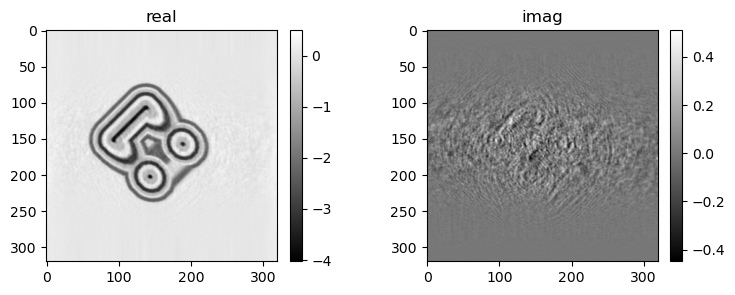

449), float(gammah)=1.6405489444732666 err=3.53403e-02
450), float(gammah)=2.0859017372131348 err=3.48993e-02
451), float(gammah)=1.5522754192352295 err=3.45761e-02
452), float(gammah)=2.1143743991851807 err=3.41671e-02
453), float(gammah)=1.5650885105133057 err=3.38368e-02
454), float(gammah)=2.074949264526367 err=3.34413e-02
455), float(gammah)=1.448488473892212 err=3.31269e-02
456), float(gammah)=2.0173792839050293 err=3.27650e-02
457), float(gammah)=1.4496452808380127 err=3.24329e-02
458), float(gammah)=1.875178575515747 err=3.20998e-02
459), float(gammah)=1.7351375818252563 err=3.17464e-02
460), float(gammah)=2.1031277179718018 err=3.13997e-02
461), float(gammah)=1.7047224044799805 err=3.10529e-02
462), float(gammah)=2.1208395957946777 err=3.07269e-02
463), float(gammah)=1.5867860317230225 err=3.03937e-02
464), float(gammah)=1.629942536354065 err=3.01157e-02
465), float(gammah)=1.7430814504623413 err=2.97735e-02
466), float(gammah)=1.6682705879211426 err=2.94946e-02
467), float(ga

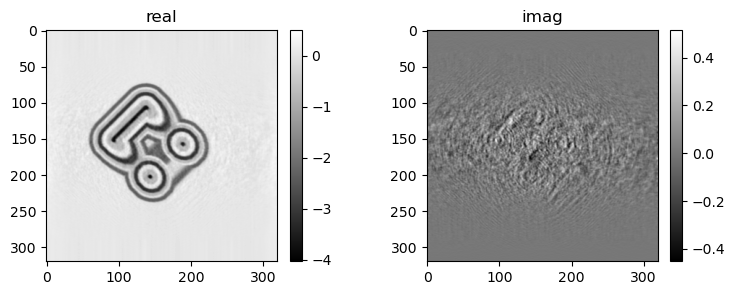

481), float(gammah)=1.8883494138717651 err=2.51712e-02
482), float(gammah)=1.7580252885818481 err=2.48972e-02
483), float(gammah)=1.575527548789978 err=2.46720e-02
484), float(gammah)=1.820367455482483 err=2.44050e-02
485), float(gammah)=1.5575636625289917 err=2.41675e-02
486), float(gammah)=2.0094070434570312 err=2.39110e-02
487), float(gammah)=1.5944005250930786 err=2.36633e-02
488), float(gammah)=1.8810749053955078 err=2.34348e-02
489), float(gammah)=1.8358827829360962 err=2.31623e-02
490), float(gammah)=1.9155234098434448 err=2.29453e-02
491), float(gammah)=1.731414556503296 err=2.26804e-02
492), float(gammah)=1.5869743824005127 err=2.24852e-02
493), float(gammah)=2.0254225730895996 err=2.22181e-02
494), float(gammah)=1.5316119194030762 err=2.20227e-02
495), float(gammah)=1.976043701171875 err=2.17724e-02
496), float(gammah)=1.5378072261810303 err=2.15725e-02
497), float(gammah)=2.00974702835083 err=2.13405e-02
498), float(gammah)=1.4107322692871094 err=2.11376e-02
499), float(gamm

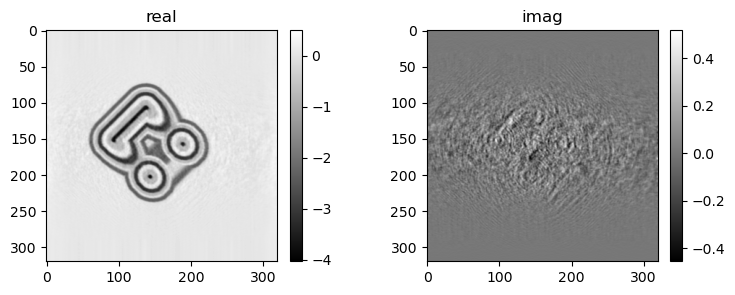

513), float(gammah)=1.5969672203063965 err=1.81275e-02
514), float(gammah)=1.9916640520095825 err=1.79506e-02
515), float(gammah)=1.6659252643585205 err=1.77588e-02
516), float(gammah)=1.7744927406311035 err=1.75988e-02
517), float(gammah)=1.669136643409729 err=1.74132e-02
518), float(gammah)=1.5562782287597656 err=1.72578e-02
519), float(gammah)=2.1544151306152344 err=1.70548e-02
520), float(gammah)=1.681951880455017 err=1.68968e-02
521), float(gammah)=2.256432056427002 err=1.67030e-02
522), float(gammah)=1.5056352615356445 err=1.65499e-02
523), float(gammah)=2.1105518341064453 err=1.63771e-02
524), float(gammah)=1.4936940670013428 err=1.62139e-02
525), float(gammah)=1.872270107269287 err=1.60659e-02
526), float(gammah)=1.599179983139038 err=1.58889e-02
527), float(gammah)=1.8124586343765259 err=1.57489e-02
528), float(gammah)=1.9751245975494385 err=1.55603e-02
529), float(gammah)=1.5456840991973877 err=1.54358e-02
530), float(gammah)=2.143453598022461 err=1.52498e-02
531), float(gamm

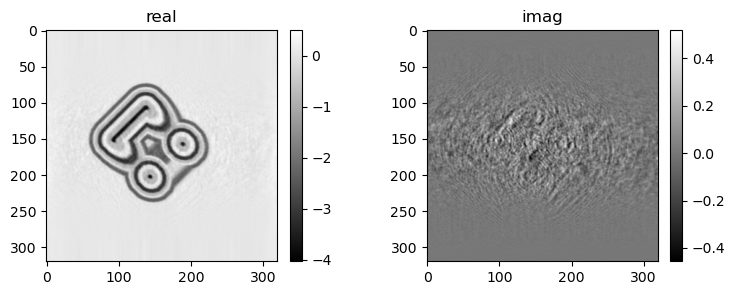

545), float(gammah)=1.8575688600540161 err=1.31313e-02
546), float(gammah)=1.3988478183746338 err=1.30194e-02
547), float(gammah)=2.082672595977783 err=1.28795e-02
548), float(gammah)=1.5306885242462158 err=1.27579e-02
549), float(gammah)=2.1223361492156982 err=1.26283e-02
550), float(gammah)=1.5592011213302612 err=1.25026e-02
551), float(gammah)=1.8618245124816895 err=1.23880e-02
552), float(gammah)=1.6643531322479248 err=1.22577e-02
553), float(gammah)=1.715849757194519 err=1.21482e-02
554), float(gammah)=2.0083045959472656 err=1.20132e-02
555), float(gammah)=1.811002254486084 err=1.19013e-02
556), float(gammah)=1.9591604471206665 err=1.17747e-02
557), float(gammah)=1.5991137027740479 err=1.16680e-02
558), float(gammah)=1.6751786470413208 err=1.15569e-02
559), float(gammah)=1.5720800161361694 err=1.14496e-02
560), float(gammah)=2.0140867233276367 err=1.13303e-02
561), float(gammah)=1.788024663925171 err=1.12184e-02
562), float(gammah)=2.035827875137329 err=1.11044e-02
563), float(gam

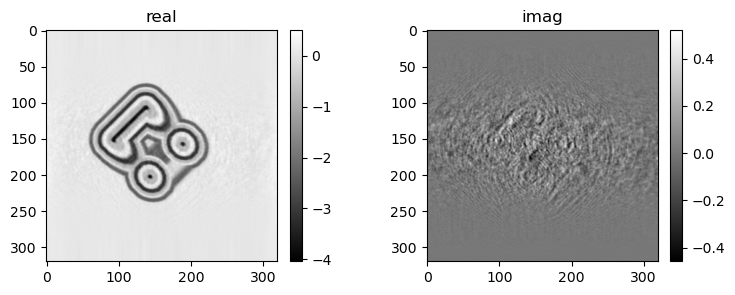

577), float(gammah)=1.9793955087661743 err=9.59221e-03
578), float(gammah)=1.6306229829788208 err=9.49346e-03
579), float(gammah)=1.4793099164962769 err=9.41877e-03
580), float(gammah)=2.01993465423584 err=9.31211e-03
581), float(gammah)=1.588571548461914 err=9.23241e-03
582), float(gammah)=2.3167378902435303 err=9.12424e-03
583), float(gammah)=1.536684513092041 err=9.04661e-03
584), float(gammah)=2.1748831272125244 err=8.94829e-03
585), float(gammah)=1.4683525562286377 err=8.87160e-03
586), float(gammah)=1.931868553161621 err=8.78243e-03
587), float(gammah)=1.504336953163147 err=8.70070e-03
588), float(gammah)=2.218700885772705 err=8.61012e-03
589), float(gammah)=1.4221686124801636 err=8.53046e-03
590), float(gammah)=2.023465633392334 err=8.45172e-03
591), float(gammah)=1.5947171449661255 err=8.36450e-03
592), float(gammah)=1.6761430501937866 err=8.29300e-03
593), float(gammah)=1.8893194198608398 err=8.20350e-03
594), float(gammah)=1.8089529275894165 err=8.12967e-03
595), float(gammah

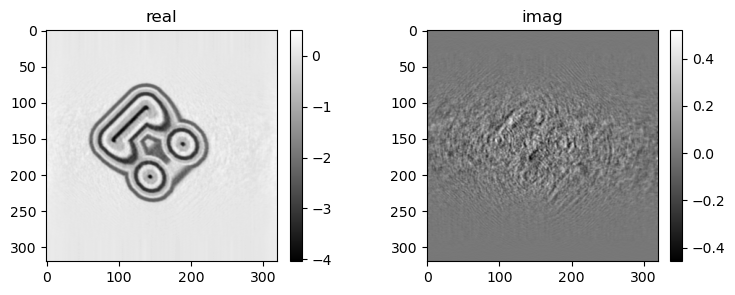

609), float(gammah)=1.676900863647461 err=7.03488e-03
610), float(gammah)=2.1371898651123047 err=6.95980e-03
611), float(gammah)=1.362082839012146 err=6.90236e-03
612), float(gammah)=1.9753150939941406 err=6.83530e-03
613), float(gammah)=1.6610984802246094 err=6.76588e-03
614), float(gammah)=2.1432688236236572 err=6.70154e-03
615), float(gammah)=1.7552775144577026 err=6.63097e-03
616), float(gammah)=1.7007986307144165 err=6.57658e-03
617), float(gammah)=1.8374240398406982 err=6.50750e-03
618), float(gammah)=1.4356496334075928 err=6.45527e-03
619), float(gammah)=1.9657021760940552 err=6.38875e-03
620), float(gammah)=1.6571913957595825 err=6.32868e-03
621), float(gammah)=2.127324342727661 err=6.26608e-03
622), float(gammah)=1.6346254348754883 err=6.20628e-03
623), float(gammah)=1.9029788970947266 err=6.14959e-03
624), float(gammah)=1.6116271018981934 err=6.09078e-03
625), float(gammah)=1.6027973890304565 err=6.03869e-03
626), float(gammah)=1.866573452949524 err=5.97723e-03
627), float(ga

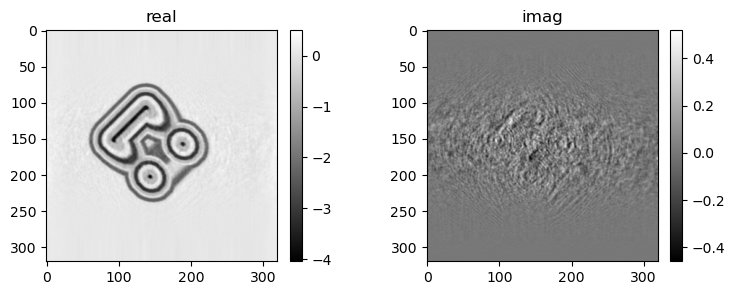

641), float(gammah)=1.8105616569519043 err=5.18838e-03
642), float(gammah)=1.536863088607788 err=5.14732e-03
643), float(gammah)=1.98646879196167 err=5.09325e-03
644), float(gammah)=1.377892017364502 err=5.05251e-03
645), float(gammah)=2.169415235519409 err=5.00228e-03
646), float(gammah)=1.4677817821502686 err=4.95602e-03
647), float(gammah)=2.17596697807312 err=4.90895e-03
648), float(gammah)=1.6180601119995117 err=4.86124e-03
649), float(gammah)=1.7765767574310303 err=4.82078e-03
650), float(gammah)=1.8277825117111206 err=4.77067e-03
651), float(gammah)=1.4604531526565552 err=4.73448e-03
652), float(gammah)=2.180354595184326 err=4.68146e-03
653), float(gammah)=1.44809889793396 err=4.64438e-03
654), float(gammah)=2.2183525562286377 err=4.59622e-03
655), float(gammah)=1.3541724681854248 err=4.55835e-03
656), float(gammah)=2.0474822521209717 err=4.51533e-03
657), float(gammah)=1.5343570709228516 err=4.47336e-03
658), float(gammah)=2.0780317783355713 err=4.43145e-03
659), float(gammah)=

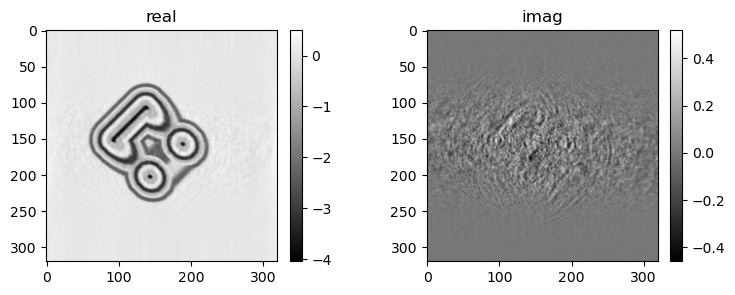

673), float(gammah)=1.5823073387145996 err=3.86372e-03
674), float(gammah)=1.929988980293274 err=3.82351e-03
675), float(gammah)=1.5762733221054077 err=3.79203e-03
676), float(gammah)=2.198582649230957 err=3.75283e-03
677), float(gammah)=1.4753609895706177 err=3.72277e-03
678), float(gammah)=1.9429250955581665 err=3.68701e-03
679), float(gammah)=1.5764790773391724 err=3.65481e-03
680), float(gammah)=1.760331392288208 err=3.62292e-03
681), float(gammah)=1.6425154209136963 err=3.58898e-03
682), float(gammah)=1.842126727104187 err=3.55784e-03
683), float(gammah)=1.86110258102417 err=3.52271e-03
684), float(gammah)=1.7349379062652588 err=3.49304e-03
685), float(gammah)=1.7715543508529663 err=3.45907e-03
686), float(gammah)=1.656988263130188 err=3.43083e-03
687), float(gammah)=1.7293339967727661 err=3.39893e-03
688), float(gammah)=1.5947614908218384 err=3.37018e-03
689), float(gammah)=1.9036757946014404 err=3.33795e-03
690), float(gammah)=1.6277129650115967 err=3.30895e-03
691), float(gamma

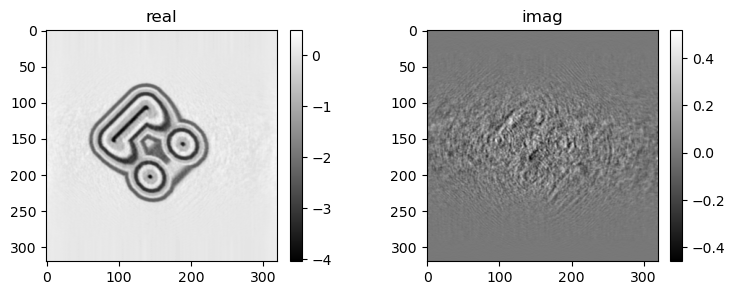

705), float(gammah)=1.7074072360992432 err=2.88820e-03
706), float(gammah)=1.786412239074707 err=2.86466e-03
707), float(gammah)=1.9488705396652222 err=2.83525e-03
708), float(gammah)=1.6830660104751587 err=2.81267e-03
709), float(gammah)=1.9252102375030518 err=2.78454e-03
710), float(gammah)=1.3803961277008057 err=2.76340e-03
711), float(gammah)=2.0559232234954834 err=2.73724e-03
712), float(gammah)=1.4628082513809204 err=2.71321e-03
713), float(gammah)=2.1551592350006104 err=2.68823e-03
714), float(gammah)=1.602251410484314 err=2.66376e-03
715), float(gammah)=1.8944989442825317 err=2.64100e-03
716), float(gammah)=1.532428503036499 err=2.61705e-03
717), float(gammah)=1.8127210140228271 err=2.59516e-03
718), float(gammah)=1.7343403100967407 err=2.57051e-03
719), float(gammah)=1.7975722551345825 err=2.54909e-03
720), float(gammah)=1.7630349397659302 err=2.52477e-03
721), float(gammah)=1.5244383811950684 err=2.50568e-03
722), float(gammah)=1.9333158731460571 err=2.48089e-03
723), float(g

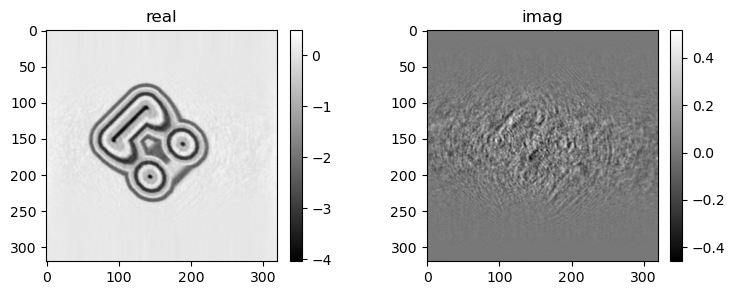

737), float(gammah)=2.10768985748291 err=2.17236e-03
738), float(gammah)=1.4943804740905762 err=2.15370e-03
739), float(gammah)=2.0901846885681152 err=2.13463e-03
740), float(gammah)=1.4909111261367798 err=2.11592e-03
741), float(gammah)=1.774941325187683 err=2.09900e-03
742), float(gammah)=1.827508807182312 err=2.07835e-03
743), float(gammah)=1.696851372718811 err=2.06166e-03
744), float(gammah)=1.7777760028839111 err=2.04290e-03
745), float(gammah)=1.5164200067520142 err=2.02701e-03
746), float(gammah)=2.0166306495666504 err=2.00741e-03
747), float(gammah)=1.5711003541946411 err=1.99091e-03
748), float(gammah)=2.011687994003296 err=1.97273e-03
749), float(gammah)=1.5403947830200195 err=1.95605e-03
750), float(gammah)=2.0804755687713623 err=1.93820e-03
751), float(gammah)=1.5217252969741821 err=1.92217e-03
752), float(gammah)=1.7190924882888794 err=1.90612e-03
753), float(gammah)=1.6692302227020264 err=1.88877e-03
754), float(gammah)=1.8392729759216309 err=1.87315e-03
755), float(gamm

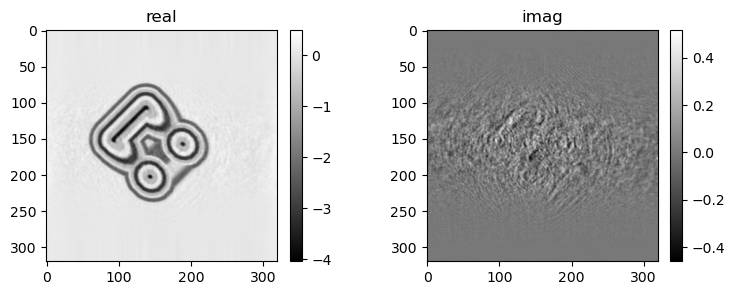

769), float(gammah)=1.4692835807800293 err=1.64425e-03
770), float(gammah)=1.8148642778396606 err=1.62944e-03
771), float(gammah)=1.6319938898086548 err=1.61569e-03
772), float(gammah)=2.094339609146118 err=1.60065e-03
773), float(gammah)=1.6206202507019043 err=1.58709e-03
774), float(gammah)=1.9009253978729248 err=1.57374e-03
775), float(gammah)=1.6165417432785034 err=1.55937e-03
776), float(gammah)=1.5999386310577393 err=1.54774e-03
777), float(gammah)=1.941157341003418 err=1.53260e-03
778), float(gammah)=1.5405073165893555 err=1.52101e-03
779), float(gammah)=2.10675048828125 err=1.50613e-03
780), float(gammah)=1.4984333515167236 err=1.49457e-03
781), float(gammah)=1.871233344078064 err=1.48157e-03
782), float(gammah)=1.5689610242843628 err=1.46847e-03
783), float(gammah)=1.9291002750396729 err=1.45627e-03
784), float(gammah)=1.7361595630645752 err=1.44293e-03
785), float(gammah)=1.7483996152877808 err=1.43150e-03
786), float(gammah)=1.7395496368408203 err=1.41826e-03
787), float(gam

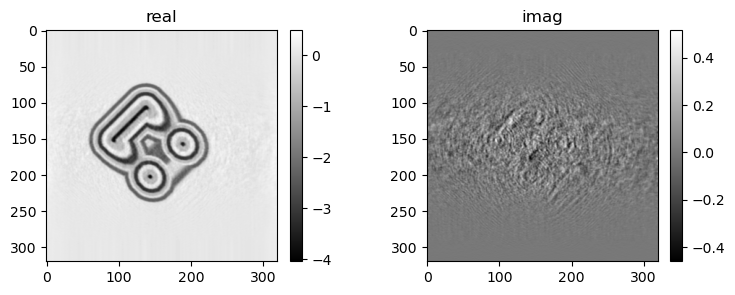

801), float(gammah)=1.9895799160003662 err=1.24682e-03
802), float(gammah)=1.4761677980422974 err=1.23707e-03
803), float(gammah)=2.176112413406372 err=1.22567e-03
804), float(gammah)=1.5171992778778076 err=1.21543e-03
805), float(gammah)=1.8532882928848267 err=1.20567e-03
806), float(gammah)=1.6048222780227661 err=1.19503e-03
807), float(gammah)=1.7423492670059204 err=1.18548e-03
808), float(gammah)=1.8110134601593018 err=1.17469e-03
809), float(gammah)=1.7657116651535034 err=1.16513e-03
810), float(gammah)=1.8002256155014038 err=1.15494e-03
811), float(gammah)=1.7570133209228516 err=1.14549e-03
812), float(gammah)=1.6221462488174438 err=1.13599e-03
813), float(gammah)=1.6147477626800537 err=1.12681e-03
814), float(gammah)=2.0454487800598145 err=1.11645e-03
815), float(gammah)=1.5174260139465332 err=1.10768e-03
816), float(gammah)=2.0577633380889893 err=1.09790e-03
817), float(gammah)=1.4720630645751953 err=1.08887e-03
818), float(gammah)=1.8913500308990479 err=1.08000e-03
819), float

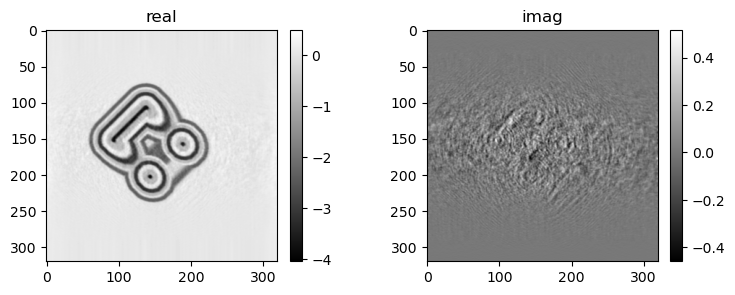

833), float(gammah)=1.4963942766189575 err=9.52431e-04
834), float(gammah)=2.0400097370147705 err=9.44004e-04
835), float(gammah)=1.6327612400054932 err=9.35972e-04
836), float(gammah)=1.8649506568908691 err=9.28635e-04
837), float(gammah)=1.585731029510498 err=9.20431e-04
838), float(gammah)=1.6877720355987549 err=9.13683e-04
839), float(gammah)=1.9143974781036377 err=9.05117e-04
840), float(gammah)=1.5880285501480103 err=8.98462e-04
841), float(gammah)=1.9308366775512695 err=8.90393e-04
842), float(gammah)=1.4977911710739136 err=8.83596e-04
843), float(gammah)=1.8692289590835571 err=8.75898e-04
844), float(gammah)=1.580737590789795 err=8.69158e-04
845), float(gammah)=2.030102252960205 err=8.61497e-04
846), float(gammah)=1.5308374166488647 err=8.54699e-04
847), float(gammah)=1.9013187885284424 err=8.47552e-04
848), float(gammah)=1.504733681678772 err=8.40795e-04
849), float(gammah)=1.8260208368301392 err=8.34178e-04
850), float(gammah)=1.7120403051376343 err=8.26645e-04
851), float(ga

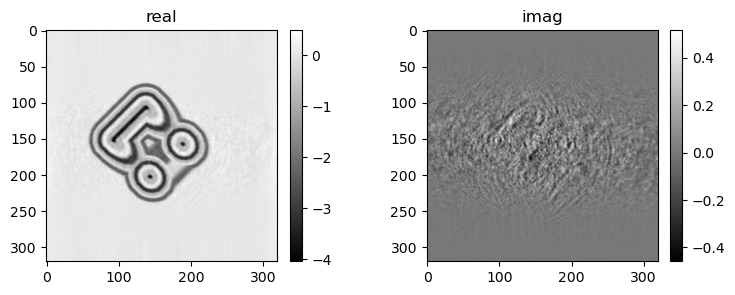

865), float(gammah)=1.9851341247558594 err=7.31049e-04
866), float(gammah)=1.5345104932785034 err=7.25206e-04
867), float(gammah)=1.747226595878601 err=7.19624e-04
868), float(gammah)=1.7198227643966675 err=7.13337e-04
869), float(gammah)=1.7624188661575317 err=7.07863e-04
870), float(gammah)=1.8880341053009033 err=7.01618e-04
871), float(gammah)=1.5825234651565552 err=6.96496e-04
872), float(gammah)=1.8312252759933472 err=6.90451e-04
873), float(gammah)=1.5430200099945068 err=6.85286e-04
874), float(gammah)=1.9076855182647705 err=6.79477e-04
875), float(gammah)=1.532951831817627 err=6.74237e-04
876), float(gammah)=2.140009641647339 err=6.68295e-04
877), float(gammah)=1.5118666887283325 err=6.63118e-04
878), float(gammah)=1.8327709436416626 err=6.57899e-04
879), float(gammah)=1.6580454111099243 err=6.52289e-04
880), float(gammah)=1.7474462985992432 err=6.47505e-04
881), float(gammah)=1.7479934692382812 err=6.41861e-04
882), float(gammah)=1.6063783168792725 err=6.37112e-04
883), float(g

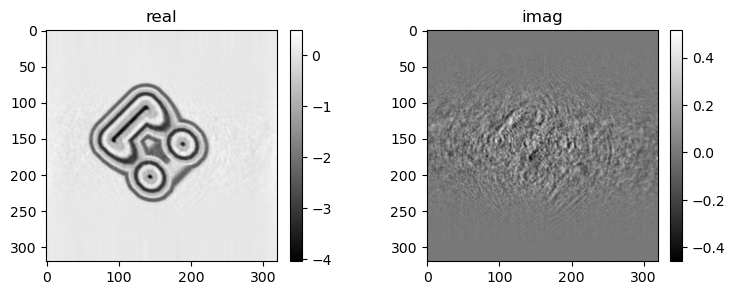

897), float(gammah)=1.4410054683685303 err=5.64707e-04
898), float(gammah)=1.8284090757369995 err=5.60418e-04
899), float(gammah)=1.662229061126709 err=5.55605e-04
900), float(gammah)=1.8168729543685913 err=5.51460e-04
901), float(gammah)=1.749672532081604 err=5.46621e-04
902), float(gammah)=1.5519894361495972 err=5.42869e-04
903), float(gammah)=1.8596930503845215 err=5.38229e-04
904), float(gammah)=1.5293940305709839 err=5.34239e-04
905), float(gammah)=1.8731775283813477 err=5.29815e-04
906), float(gammah)=1.5996869802474976 err=5.25709e-04
907), float(gammah)=1.8951352834701538 err=5.21542e-04
908), float(gammah)=1.537390112876892 err=5.17275e-04
909), float(gammah)=1.759097933769226 err=5.13443e-04
910), float(gammah)=1.83616304397583 err=5.08966e-04
911), float(gammah)=1.5919044017791748 err=5.05329e-04
912), float(gammah)=1.8669288158416748 err=5.00957e-04
913), float(gammah)=1.5010144710540771 err=4.97411e-04
914), float(gammah)=2.0492446422576904 err=4.93054e-04
915), float(gamm

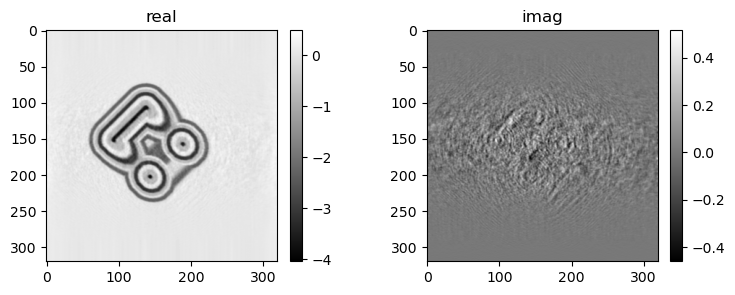

929), float(gammah)=1.6048320531845093 err=4.38326e-04
930), float(gammah)=1.9499751329421997 err=4.34494e-04
931), float(gammah)=1.4776527881622314 err=4.31505e-04
932), float(gammah)=1.899333119392395 err=4.27949e-04
933), float(gammah)=1.5719974040985107 err=4.24688e-04
934), float(gammah)=1.738209843635559 err=4.21608e-04
935), float(gammah)=1.7546671628952026 err=4.17990e-04
936), float(gammah)=1.6327940225601196 err=4.15107e-04
937), float(gammah)=1.8127409219741821 err=4.11623e-04
938), float(gammah)=1.52200186252594 err=4.08689e-04
939), float(gammah)=2.001868486404419 err=4.05259e-04
940), float(gammah)=1.4736120700836182 err=4.02400e-04
941), float(gammah)=1.9492201805114746 err=3.99086e-04
942), float(gammah)=1.557834506034851 err=3.96118e-04
943), float(gammah)=1.7896159887313843 err=3.93104e-04
944), float(gammah)=1.5872291326522827 err=3.90075e-04
945), float(gammah)=1.8096402883529663 err=3.87127e-04
946), float(gammah)=1.6803611516952515 err=3.83987e-04
947), float(gamm

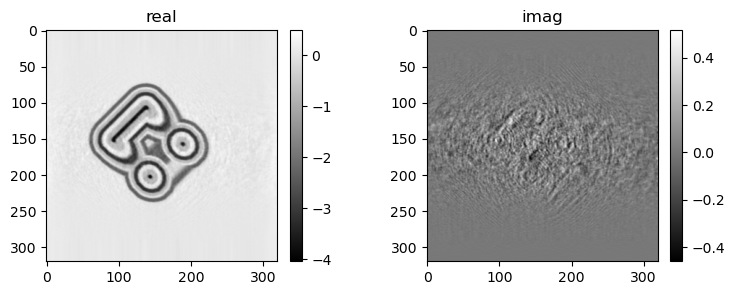

961), float(gammah)=1.9058575630187988 err=3.42508e-04
962), float(gammah)=1.5619549751281738 err=3.39816e-04
963), float(gammah)=1.762353777885437 err=3.37430e-04
964), float(gammah)=1.5974541902542114 err=3.34661e-04
965), float(gammah)=1.6318646669387817 err=3.32419e-04
966), float(gammah)=1.8283060789108276 err=3.29653e-04
967), float(gammah)=1.4869974851608276 err=3.27367e-04
968), float(gammah)=1.9155794382095337 err=3.24785e-04
969), float(gammah)=1.4709374904632568 err=3.22465e-04
970), float(gammah)=1.7825978994369507 err=3.20044e-04
971), float(gammah)=1.6234190464019775 err=3.17608e-04
972), float(gammah)=1.6547142267227173 err=3.15326e-04
973), float(gammah)=1.7338582277297974 err=3.12824e-04
974), float(gammah)=1.5756267309188843 err=3.10671e-04
975), float(gammah)=1.7593892812728882 err=3.08260e-04
976), float(gammah)=1.5029325485229492 err=3.06117e-04
977), float(gammah)=1.842007040977478 err=3.03717e-04
978), float(gammah)=1.5785998106002808 err=3.01455e-04
979), float(

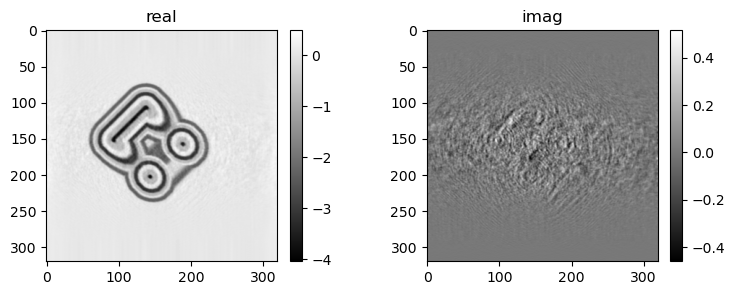

993), float(gammah)=1.8370983600616455 err=2.69786e-04
994), float(gammah)=1.5771564245224 err=2.67710e-04
995), float(gammah)=1.6389238834381104 err=2.65925e-04
996), float(gammah)=1.730883240699768 err=2.63782e-04
997), float(gammah)=1.5696102380752563 err=2.62031e-04
998), float(gammah)=1.8234105110168457 err=2.59961e-04
999), float(gammah)=1.4287623167037964 err=2.58202e-04
1000), float(gammah)=1.8824876546859741 err=2.56230e-04
1001), float(gammah)=1.540725827217102 err=2.54387e-04
1002), float(gammah)=1.695288896560669 err=2.52602e-04
1003), float(gammah)=1.6919554471969604 err=2.50683e-04
1004), float(gammah)=1.5744529962539673 err=2.48986e-04
1005), float(gammah)=1.7283954620361328 err=2.47053e-04
1006), float(gammah)=1.4980697631835938 err=2.45432e-04
1007), float(gammah)=1.849317193031311 err=2.43521e-04
1008), float(gammah)=1.4675275087356567 err=2.41853e-04
1009), float(gammah)=1.8885594606399536 err=2.40055e-04
1010), float(gammah)=1.5177767276763916 err=2.38308e-04
1011),

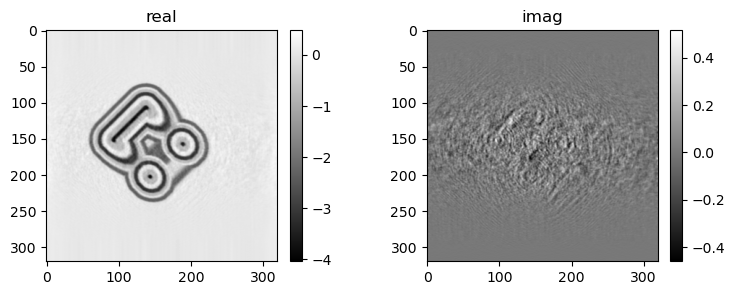

1025), float(gammah)=1.547224760055542 err=2.14200e-04
1026), float(gammah)=1.7961608171463013 err=2.12505e-04
1027), float(gammah)=1.4327157735824585 err=2.11168e-04
1028), float(gammah)=1.8870173692703247 err=2.09561e-04
1029), float(gammah)=1.4650228023529053 err=2.08140e-04
1030), float(gammah)=1.6809271574020386 err=2.06706e-04
1031), float(gammah)=1.609993577003479 err=2.05224e-04
1032), float(gammah)=1.605624794960022 err=2.03839e-04
1033), float(gammah)=1.6860578060150146 err=2.02309e-04
1034), float(gammah)=1.5283416509628296 err=2.01008e-04
1035), float(gammah)=1.7896068096160889 err=1.99504e-04
1036), float(gammah)=1.4652963876724243 err=1.98213e-04
1037), float(gammah)=1.7845873832702637 err=1.96786e-04
1038), float(gammah)=1.5185961723327637 err=1.95415e-04
1039), float(gammah)=1.6849216222763062 err=1.94079e-04
1040), float(gammah)=1.6473852396011353 err=1.92668e-04
1041), float(gammah)=1.5138894319534302 err=1.91425e-04
1042), float(gammah)=1.802267074584961 err=1.90019e

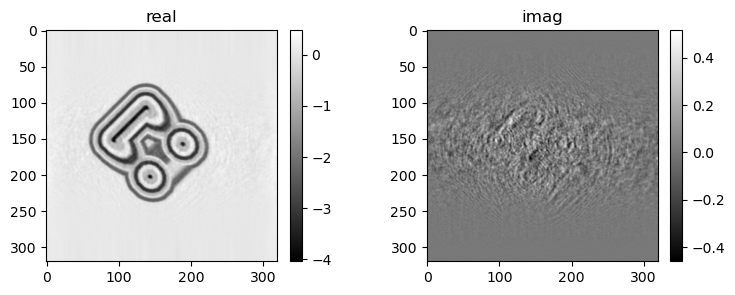

1057), float(gammah)=1.4690159559249878 err=1.71431e-04
1058), float(gammah)=1.7687605619430542 err=1.70274e-04
1059), float(gammah)=1.4700082540512085 err=1.69115e-04
1060), float(gammah)=1.5972836017608643 err=1.68025e-04
1061), float(gammah)=1.6974226236343384 err=1.66822e-04
1062), float(gammah)=1.4646482467651367 err=1.65773e-04
1063), float(gammah)=1.739574670791626 err=1.64621e-04
1064), float(gammah)=1.4594544172286987 err=1.63524e-04
1065), float(gammah)=1.6598490476608276 err=1.62475e-04
1066), float(gammah)=1.6404376029968262 err=1.61289e-04
1067), float(gammah)=1.4305628538131714 err=1.60320e-04
1068), float(gammah)=1.887474775314331 err=1.59178e-04
1069), float(gammah)=1.4216625690460205 err=1.58145e-04
1070), float(gammah)=1.6621896028518677 err=1.57139e-04
1071), float(gammah)=1.6285254955291748 err=1.56009e-04
1072), float(gammah)=1.5486748218536377 err=1.55071e-04
1073), float(gammah)=1.6920641660690308 err=1.53979e-04
1074), float(gammah)=1.4654337167739868 err=1.5299

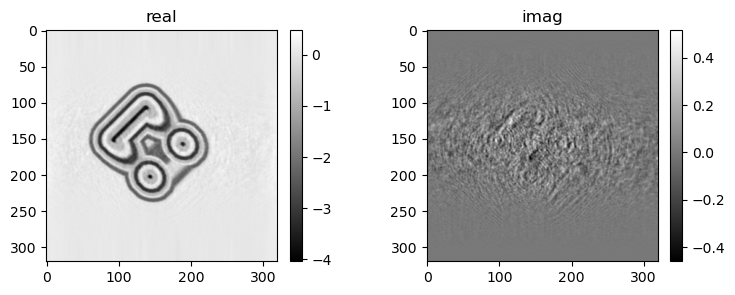

1089), float(gammah)=1.6755282878875732 err=1.38698e-04
1090), float(gammah)=1.5609275102615356 err=1.37750e-04
1091), float(gammah)=1.5144881010055542 err=1.36932e-04
1092), float(gammah)=1.6905566453933716 err=1.35985e-04
1093), float(gammah)=1.4368033409118652 err=1.35173e-04
1094), float(gammah)=1.6931720972061157 err=1.34303e-04
1095), float(gammah)=1.4732784032821655 err=1.33424e-04
1096), float(gammah)=1.6029773950576782 err=1.32599e-04
1097), float(gammah)=1.5922600030899048 err=1.31722e-04
1098), float(gammah)=1.462985873222351 err=1.30937e-04
1099), float(gammah)=1.7108467817306519 err=1.30071e-04
1100), float(gammah)=1.4720522165298462 err=1.29235e-04
1101), float(gammah)=1.5137784481048584 err=1.28472e-04
1102), float(gammah)=1.6835064888000488 err=1.27589e-04
1103), float(gammah)=1.4191534519195557 err=1.26839e-04
1104), float(gammah)=1.6783231496810913 err=1.26005e-04
1105), float(gammah)=1.4851305484771729 err=1.25228e-04
1106), float(gammah)=1.5693162679672241 err=1.244

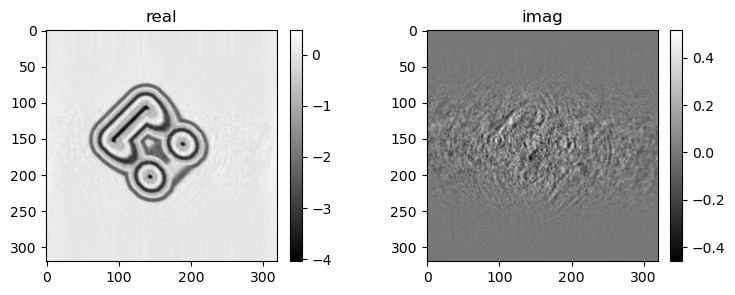

1121), float(gammah)=1.5678280591964722 err=1.13437e-04
1122), float(gammah)=1.4960622787475586 err=1.12749e-04
1123), float(gammah)=1.5557427406311035 err=1.12091e-04
1124), float(gammah)=1.5541040897369385 err=1.11387e-04
1125), float(gammah)=1.4458873271942139 err=1.10762e-04
1126), float(gammah)=1.686828374862671 err=1.10050e-04
1127), float(gammah)=1.4133188724517822 err=1.09414e-04
1128), float(gammah)=1.6035248041152954 err=1.08775e-04
1129), float(gammah)=1.5279767513275146 err=1.08131e-04
1130), float(gammah)=1.4636225700378418 err=1.07522e-04
1131), float(gammah)=1.6277570724487305 err=1.06860e-04
1132), float(gammah)=1.4257702827453613 err=1.06256e-04
1133), float(gammah)=1.5767003297805786 err=1.05616e-04
1134), float(gammah)=1.4841727018356323 err=1.04997e-04
1135), float(gammah)=1.4795640707015991 err=1.04411e-04
1136), float(gammah)=1.629794955253601 err=1.03767e-04
1137), float(gammah)=1.3917510509490967 err=1.03197e-04
1138), float(gammah)=1.5783989429473877 err=1.0260

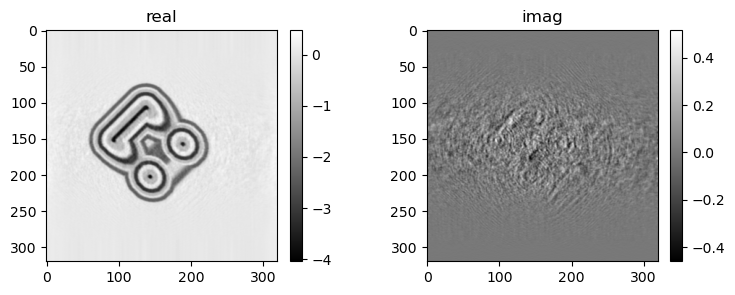

1153), float(gammah)=1.586648941040039 err=9.42886e-05
1154), float(gammah)=1.484506607055664 err=9.37594e-05
1155), float(gammah)=1.4650676250457764 err=9.32749e-05
1156), float(gammah)=1.5782053470611572 err=9.27547e-05
1157), float(gammah)=1.5144743919372559 err=9.22605e-05
1158), float(gammah)=1.4920039176940918 err=9.17900e-05
1159), float(gammah)=1.5062975883483887 err=9.12792e-05
1160), float(gammah)=1.534564733505249 err=9.08017e-05
1161), float(gammah)=1.5463087558746338 err=9.03175e-05
1162), float(gammah)=1.4049386978149414 err=8.98793e-05
1163), float(gammah)=1.6054893732070923 err=8.93861e-05
1164), float(gammah)=1.4797037839889526 err=8.89224e-05
1165), float(gammah)=1.4722219705581665 err=8.84621e-05
1166), float(gammah)=1.526648998260498 err=8.79860e-05
1167), float(gammah)=1.423317313194275 err=8.75726e-05
1168), float(gammah)=1.5911651849746704 err=8.71016e-05
1169), float(gammah)=1.4301981925964355 err=8.66388e-05
1170), float(gammah)=1.475999116897583 err=8.62300e-0

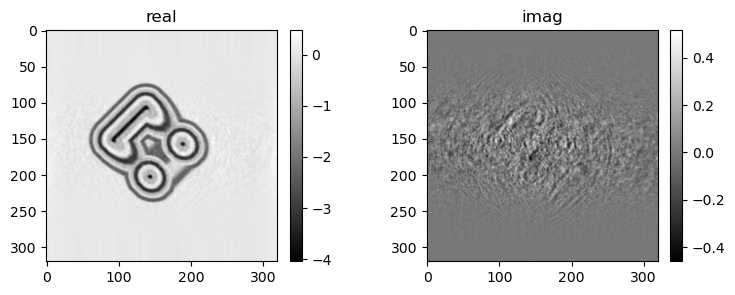

1185), float(gammah)=1.4708867073059082 err=8.00438e-05
1186), float(gammah)=1.5186841487884521 err=7.96248e-05
1187), float(gammah)=1.4147815704345703 err=7.92656e-05
1188), float(gammah)=1.532444715499878 err=7.88767e-05
1189), float(gammah)=1.4700164794921875 err=7.84801e-05
1190), float(gammah)=1.4232159852981567 err=7.81378e-05
1191), float(gammah)=1.5454227924346924 err=7.77747e-05
1192), float(gammah)=1.435458779335022 err=7.73856e-05
1193), float(gammah)=1.497763752937317 err=7.70689e-05
1194), float(gammah)=1.4508476257324219 err=7.66967e-05
1195), float(gammah)=1.4519119262695312 err=7.63391e-05
1196), float(gammah)=1.5422602891921997 err=7.60068e-05
1197), float(gammah)=1.376871943473816 err=7.56623e-05
1198), float(gammah)=1.4951902627944946 err=7.53154e-05
1199), float(gammah)=1.550066590309143 err=7.49654e-05
1200), float(gammah)=1.37345552444458 err=7.46448e-05
1201), float(gammah)=1.5439735651016235 err=7.42954e-05
1202), float(gammah)=1.458633303642273 err=7.39726e-05


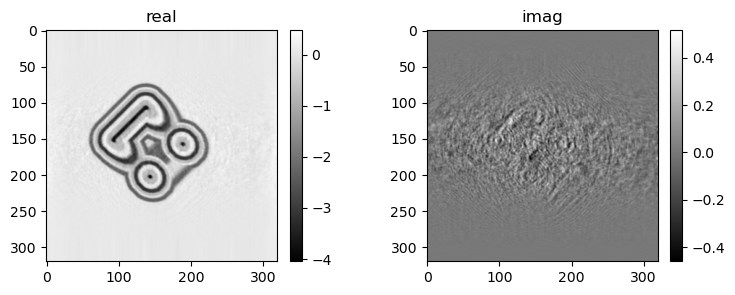

1217), float(gammah)=1.4866068363189697 err=6.93327e-05
1218), float(gammah)=1.439141035079956 err=6.90652e-05
1219), float(gammah)=1.5148521661758423 err=6.87931e-05
1220), float(gammah)=1.3794169425964355 err=6.85152e-05
1221), float(gammah)=1.5411165952682495 err=6.82346e-05
1222), float(gammah)=1.42657470703125 err=6.79482e-05
1223), float(gammah)=1.4472825527191162 err=6.76958e-05
1224), float(gammah)=1.4969675540924072 err=6.74269e-05
1225), float(gammah)=1.4144245386123657 err=6.71516e-05
1226), float(gammah)=1.4756989479064941 err=6.69026e-05
1227), float(gammah)=1.469373106956482 err=6.66328e-05
1228), float(gammah)=1.401961326599121 err=6.63709e-05
1229), float(gammah)=1.5168195962905884 err=6.61202e-05
1230), float(gammah)=1.4058470726013184 err=6.58613e-05
1231), float(gammah)=1.4815081357955933 err=6.56197e-05
1232), float(gammah)=1.4580247402191162 err=6.53787e-05
1233), float(gammah)=1.4427891969680786 err=6.51395e-05
1234), float(gammah)=1.469436764717102 err=6.48893e-0

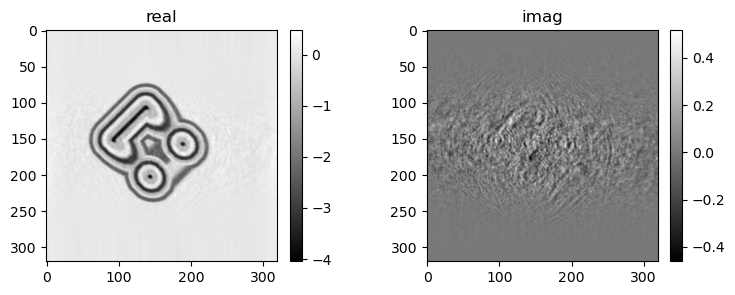

1249), float(gammah)=1.4675050973892212 err=6.16841e-05
1250), float(gammah)=1.4470453262329102 err=6.14843e-05
1251), float(gammah)=1.427564263343811 err=6.13037e-05
1252), float(gammah)=1.5015203952789307 err=6.10927e-05
1253), float(gammah)=1.4129365682601929 err=6.09050e-05
1254), float(gammah)=1.440760612487793 err=6.07223e-05
1255), float(gammah)=1.4980567693710327 err=6.05293e-05
1256), float(gammah)=1.3901262283325195 err=6.03586e-05
1257), float(gammah)=1.5018473863601685 err=6.01759e-05
1258), float(gammah)=1.4057337045669556 err=5.99939e-05
1259), float(gammah)=1.4506269693374634 err=5.98167e-05
1260), float(gammah)=1.487416386604309 err=5.96298e-05
1261), float(gammah)=1.4087406396865845 err=5.94673e-05
1262), float(gammah)=1.4776499271392822 err=5.92978e-05
1263), float(gammah)=1.4460686445236206 err=5.91274e-05
1264), float(gammah)=1.4254275560379028 err=5.89821e-05
1265), float(gammah)=1.5035178661346436 err=5.88262e-05
1266), float(gammah)=1.3709534406661987 err=5.86672

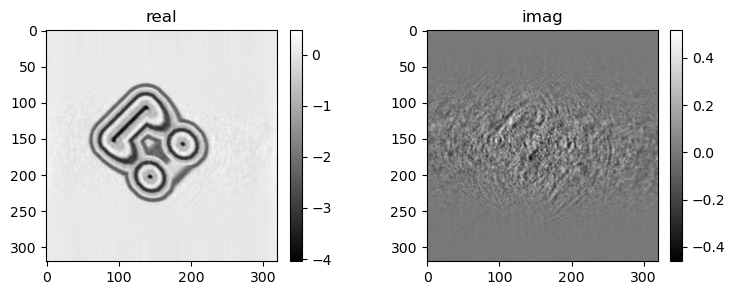

1281), float(gammah)=1.4538671970367432 err=5.65553e-05
1282), float(gammah)=1.4104342460632324 err=5.64448e-05
1283), float(gammah)=1.473239779472351 err=5.63195e-05
1284), float(gammah)=1.4111573696136475 err=5.62075e-05
1285), float(gammah)=1.4240525960922241 err=5.61043e-05
1286), float(gammah)=1.4871268272399902 err=5.59806e-05
1287), float(gammah)=1.3601292371749878 err=5.58746e-05
1288), float(gammah)=1.4867994785308838 err=5.57638e-05
1289), float(gammah)=1.4225070476531982 err=5.56204e-05
1290), float(gammah)=1.384884238243103 err=5.55064e-05
1291), float(gammah)=1.5001088380813599 err=5.53861e-05
1292), float(gammah)=1.3895456790924072 err=5.52565e-05
1293), float(gammah)=1.442065954208374 err=5.51611e-05
1294), float(gammah)=1.4917597770690918 err=5.50487e-05
1295), float(gammah)=1.379822850227356 err=5.49644e-05
1296), float(gammah)=1.4686530828475952 err=5.48580e-05
1297), float(gammah)=1.4173929691314697 err=5.47650e-05
1298), float(gammah)=1.430478572845459 err=5.46594e-

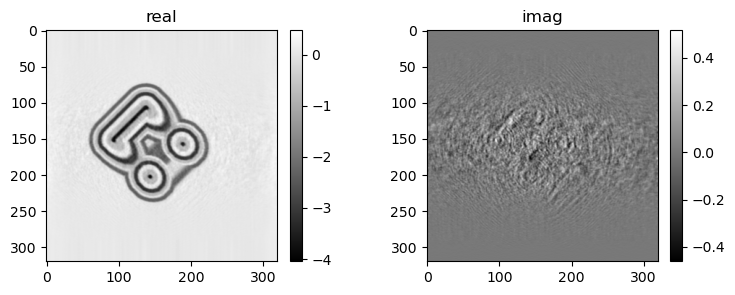

1313), float(gammah)=1.401374101638794 err=5.32567e-05
1314), float(gammah)=1.4503536224365234 err=5.31664e-05
1315), float(gammah)=1.4121915102005005 err=5.30718e-05
1316), float(gammah)=1.3874244689941406 err=5.29926e-05
1317), float(gammah)=1.525812029838562 err=5.29169e-05
1318), float(gammah)=1.3578249216079712 err=5.28279e-05
1319), float(gammah)=1.452509880065918 err=5.27641e-05
1320), float(gammah)=1.4488552808761597 err=5.26911e-05
1321), float(gammah)=1.3988194465637207 err=5.26216e-05
1322), float(gammah)=1.4701416492462158 err=5.25660e-05
1323), float(gammah)=1.378334403038025 err=5.25026e-05
1324), float(gammah)=1.4403879642486572 err=5.24343e-05
1325), float(gammah)=1.4495664834976196 err=5.23821e-05
1326), float(gammah)=1.385045051574707 err=5.23216e-05
1327), float(gammah)=1.4497250318527222 err=5.22603e-05
1328), float(gammah)=1.419999599456787 err=5.22015e-05
1329), float(gammah)=1.4154621362686157 err=5.21476e-05
1330), float(gammah)=1.4370160102844238 err=5.20838e-0

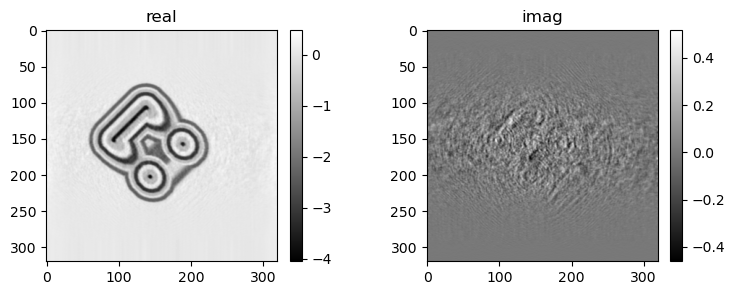

1345), float(gammah)=1.3943641185760498 err=5.16141e-05
1346), float(gammah)=1.4421683549880981 err=5.15994e-05
1347), float(gammah)=1.4028170108795166 err=5.15821e-05
1348), float(gammah)=1.447304368019104 err=5.15658e-05
1349), float(gammah)=1.3893835544586182 err=5.15655e-05
1350), float(gammah)=1.4141169786453247 err=5.15555e-05
1351), float(gammah)=1.4533395767211914 err=5.15616e-05
1352), float(gammah)=1.4048296213150024 err=5.15761e-05
1353), float(gammah)=1.4290506839752197 err=5.15749e-05
1354), float(gammah)=1.417749285697937 err=5.15935e-05
1355), float(gammah)=1.4039392471313477 err=5.16091e-05
1356), float(gammah)=1.4601781368255615 err=5.16132e-05
1357), float(gammah)=1.4049819707870483 err=5.16512e-05
1358), float(gammah)=1.4390822649002075 err=5.16759e-05
1359), float(gammah)=1.4578149318695068 err=5.17295e-05
1360), float(gammah)=1.3970364332199097 err=5.17831e-05
1361), float(gammah)=1.433905839920044 err=5.18368e-05
1362), float(gammah)=1.4341856241226196 err=5.18943

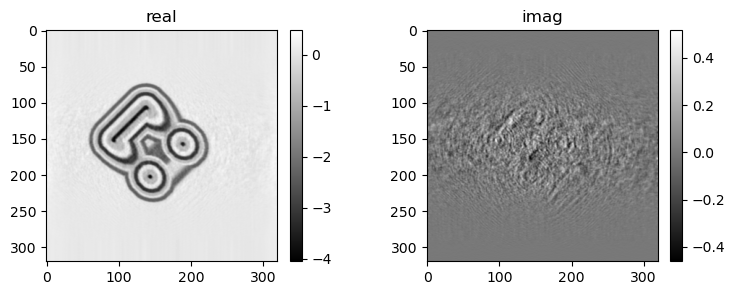

1377), float(gammah)=1.4867100715637207 err=5.30292e-05
1378), float(gammah)=1.397650122642517 err=5.31479e-05
1379), float(gammah)=1.373619556427002 err=5.32170e-05
1380), float(gammah)=1.479927897453308 err=5.33374e-05
1381), float(gammah)=1.3209494352340698 err=5.34299e-05
1382), float(gammah)=1.4519206285476685 err=5.35061e-05
1383), float(gammah)=1.392329454421997 err=5.35895e-05
1384), float(gammah)=1.3599834442138672 err=5.36662e-05
1385), float(gammah)=1.4156267642974854 err=5.37224e-05
1386), float(gammah)=1.417097806930542 err=5.37899e-05
1387), float(gammah)=1.3633551597595215 err=5.38755e-05
1388), float(gammah)=1.4447526931762695 err=5.39718e-05
1389), float(gammah)=1.394044280052185 err=5.40543e-05
1390), float(gammah)=1.404349684715271 err=5.41608e-05
1391), float(gammah)=1.4333226680755615 err=5.42888e-05
1392), float(gammah)=1.3497793674468994 err=5.43681e-05
1393), float(gammah)=1.4403122663497925 err=5.44747e-05
1394), float(gammah)=1.3762785196304321 err=5.45891e-05

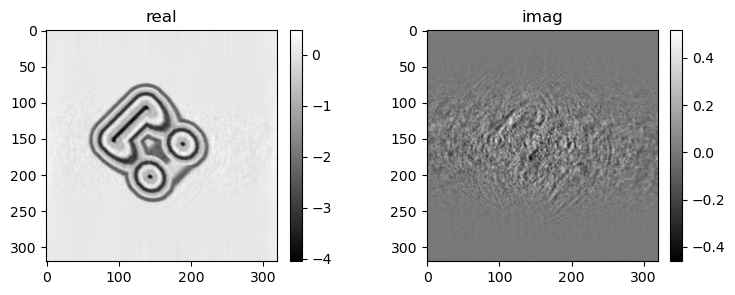

1409), float(gammah)=1.3875619173049927 err=5.62078e-05
1410), float(gammah)=1.410529375076294 err=5.63508e-05
1411), float(gammah)=1.3640168905258179 err=5.64772e-05
1412), float(gammah)=1.4791089296340942 err=5.66413e-05
1413), float(gammah)=1.3352659940719604 err=5.67877e-05
1414), float(gammah)=1.4316014051437378 err=5.69616e-05
1415), float(gammah)=1.4218212366104126 err=5.71333e-05
1416), float(gammah)=1.3501403331756592 err=5.73192e-05
1417), float(gammah)=1.4418666362762451 err=5.74826e-05
1418), float(gammah)=1.3342137336730957 err=5.76321e-05
1419), float(gammah)=1.4244691133499146 err=5.77806e-05
1420), float(gammah)=1.3831921815872192 err=5.79276e-05
1421), float(gammah)=1.3817415237426758 err=5.80788e-05
1422), float(gammah)=1.4047126770019531 err=5.82245e-05
1423), float(gammah)=1.3857498168945312 err=5.83570e-05
1424), float(gammah)=1.3844375610351562 err=5.84932e-05
1425), float(gammah)=1.4179577827453613 err=5.86357e-05
1426), float(gammah)=1.3737980127334595 err=5.877

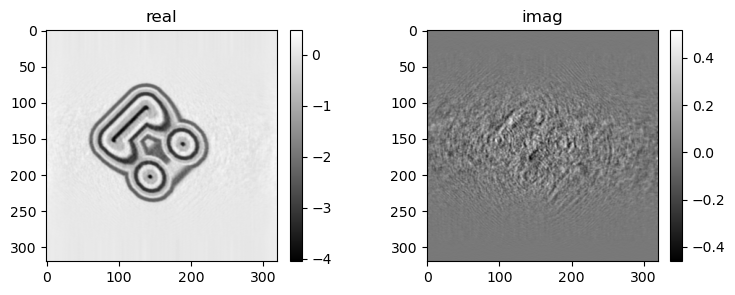

1441), float(gammah)=1.42505943775177 err=6.08495e-05
1442), float(gammah)=1.3389731645584106 err=6.09632e-05
1443), float(gammah)=1.3759760856628418 err=6.10686e-05
1444), float(gammah)=1.4056216478347778 err=6.11584e-05
1445), float(gammah)=1.3369932174682617 err=6.12510e-05
1446), float(gammah)=1.4207786321640015 err=6.13489e-05
1447), float(gammah)=1.3656271696090698 err=6.14575e-05
1448), float(gammah)=1.375178337097168 err=6.15510e-05
1449), float(gammah)=1.4045007228851318 err=6.16739e-05
1450), float(gammah)=1.3599337339401245 err=6.17806e-05
1451), float(gammah)=1.3826872110366821 err=6.19083e-05
1452), float(gammah)=1.4066354036331177 err=6.20313e-05
1453), float(gammah)=1.3734714984893799 err=6.21685e-05
1454), float(gammah)=1.3860764503479004 err=6.23136e-05
1455), float(gammah)=1.3985681533813477 err=6.24596e-05
1456), float(gammah)=1.3506439924240112 err=6.25926e-05
1457), float(gammah)=1.4130301475524902 err=6.27459e-05
1458), float(gammah)=1.3595036268234253 err=6.28984

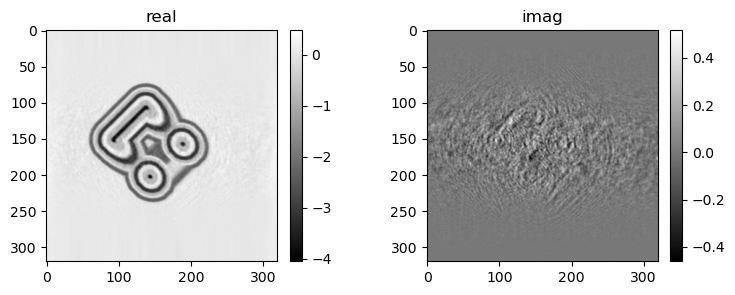

1473), float(gammah)=1.3650394678115845 err=6.53126e-05
1474), float(gammah)=1.3782528638839722 err=6.55039e-05
1475), float(gammah)=1.3765802383422852 err=6.56794e-05
1476), float(gammah)=1.3749160766601562 err=6.58689e-05
1477), float(gammah)=1.3752137422561646 err=6.60511e-05
1478), float(gammah)=1.369389295578003 err=6.62436e-05
1479), float(gammah)=1.3824529647827148 err=6.64125e-05
1480), float(gammah)=1.3443212509155273 err=6.65833e-05
1481), float(gammah)=1.4053751230239868 err=6.67664e-05
1482), float(gammah)=1.3473289012908936 err=6.69513e-05
1483), float(gammah)=1.363729476928711 err=6.71020e-05
1484), float(gammah)=1.370772123336792 err=6.72711e-05
1485), float(gammah)=1.353685736656189 err=6.74038e-05
1486), float(gammah)=1.3636269569396973 err=6.75619e-05
1487), float(gammah)=1.361457347869873 err=6.76995e-05
1488), float(gammah)=1.349031925201416 err=6.78357e-05
1489), float(gammah)=1.3953927755355835 err=6.79821e-05
1490), float(gammah)=1.3586385250091553 err=6.81482e-0

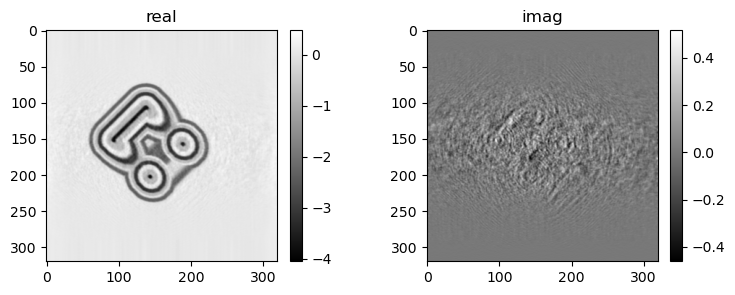

1505), float(gammah)=1.368950605392456 err=7.07883e-05
1506), float(gammah)=1.393645167350769 err=7.09792e-05
1507), float(gammah)=1.3267492055892944 err=7.11526e-05
1508), float(gammah)=1.4053869247436523 err=7.13679e-05
1509), float(gammah)=1.3830032348632812 err=7.15879e-05
1510), float(gammah)=1.3516021966934204 err=7.17906e-05
1511), float(gammah)=1.395772933959961 err=7.20149e-05
1512), float(gammah)=1.3364681005477905 err=7.22357e-05
1513), float(gammah)=1.4025003910064697 err=7.24621e-05
1514), float(gammah)=1.3619481325149536 err=7.26819e-05
1515), float(gammah)=1.3459503650665283 err=7.29146e-05
1516), float(gammah)=1.4076851606369019 err=7.31609e-05
1517), float(gammah)=1.3501561880111694 err=7.33983e-05
1518), float(gammah)=1.3878484964370728 err=7.36358e-05
1519), float(gammah)=1.3736650943756104 err=7.39111e-05
1520), float(gammah)=1.3551846742630005 err=7.41520e-05
1521), float(gammah)=1.3960862159729004 err=7.44143e-05
1522), float(gammah)=1.3561818599700928 err=7.46723

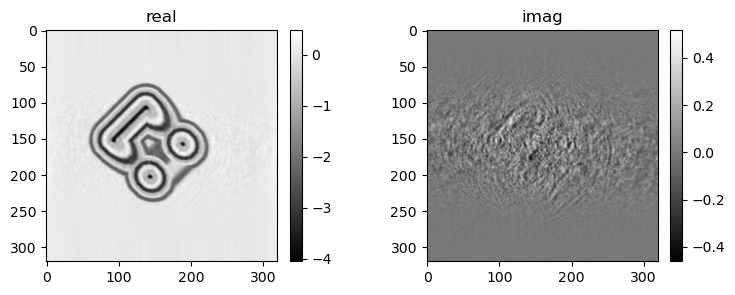

1537), float(gammah)=1.3497092723846436 err=7.86014e-05
1538), float(gammah)=1.376939058303833 err=7.88608e-05
1539), float(gammah)=1.3470432758331299 err=7.91048e-05
1540), float(gammah)=1.3923828601837158 err=7.93802e-05
1541), float(gammah)=1.3571935892105103 err=7.96539e-05
1542), float(gammah)=1.371427297592163 err=7.99197e-05
1543), float(gammah)=1.39166259765625 err=8.02295e-05
1544), float(gammah)=1.3589115142822266 err=8.05347e-05
1545), float(gammah)=1.3700385093688965 err=8.08178e-05
1546), float(gammah)=1.3747175931930542 err=8.11152e-05
1547), float(gammah)=1.3403501510620117 err=8.14048e-05
1548), float(gammah)=1.367463231086731 err=8.16648e-05
1549), float(gammah)=1.3661653995513916 err=8.19224e-05
1550), float(gammah)=1.3331290483474731 err=8.21813e-05
1551), float(gammah)=1.3822749853134155 err=8.24503e-05
1552), float(gammah)=1.361950159072876 err=8.26763e-05
1553), float(gammah)=1.3449205160140991 err=8.29387e-05
1554), float(gammah)=1.3758267164230347 err=8.32118e-0

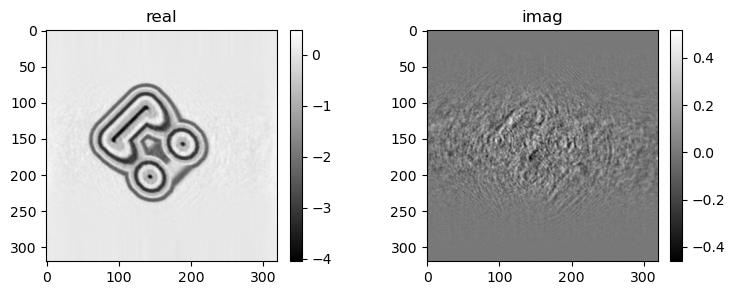

1569), float(gammah)=1.318848967552185 err=8.67167e-05
1570), float(gammah)=1.3882771730422974 err=8.69568e-05
1571), float(gammah)=1.3438732624053955 err=8.71823e-05
1572), float(gammah)=1.3561334609985352 err=8.74273e-05
1573), float(gammah)=1.368265986442566 err=8.76589e-05
1574), float(gammah)=1.3423552513122559 err=8.78910e-05
1575), float(gammah)=1.3565958738327026 err=8.81392e-05
1576), float(gammah)=1.3890694379806519 err=8.84123e-05
1577), float(gammah)=1.3144546747207642 err=8.86485e-05
1578), float(gammah)=1.3991003036499023 err=8.89232e-05
1579), float(gammah)=1.3271361589431763 err=8.91816e-05
1580), float(gammah)=1.3684630393981934 err=8.94358e-05
1581), float(gammah)=1.3780468702316284 err=8.96854e-05
1582), float(gammah)=1.3036713600158691 err=8.99741e-05
1583), float(gammah)=1.412572979927063 err=9.02444e-05
1584), float(gammah)=1.3256545066833496 err=9.05173e-05
1585), float(gammah)=1.3575739860534668 err=9.08068e-05
1586), float(gammah)=1.366087794303894 err=9.10986e

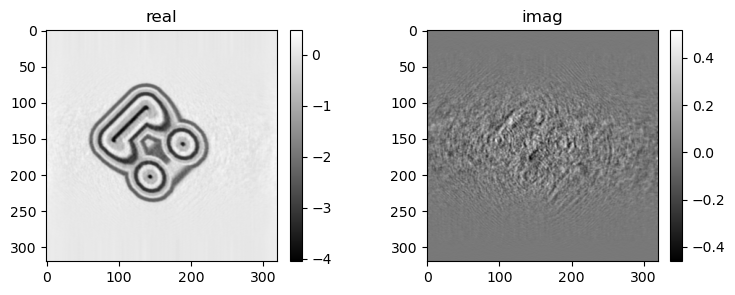

1601), float(gammah)=1.3335390090942383 err=9.60898e-05
1602), float(gammah)=1.3524364233016968 err=9.64190e-05
1603), float(gammah)=1.3349394798278809 err=9.67436e-05
1604), float(gammah)=1.356563687324524 err=9.70461e-05
1605), float(gammah)=1.3346887826919556 err=9.73443e-05
1606), float(gammah)=1.3844420909881592 err=9.76759e-05
1607), float(gammah)=1.3136075735092163 err=9.79968e-05
1608), float(gammah)=1.3899319171905518 err=9.83190e-05
1609), float(gammah)=1.3267531394958496 err=9.86386e-05
1610), float(gammah)=1.384697675704956 err=9.89787e-05
1611), float(gammah)=1.3226433992385864 err=9.93325e-05
1612), float(gammah)=1.3871054649353027 err=9.96934e-05
1613), float(gammah)=1.3257907629013062 err=1.00056e-04
1614), float(gammah)=1.3789395093917847 err=1.00429e-04
1615), float(gammah)=1.3311704397201538 err=1.00785e-04
1616), float(gammah)=1.3683748245239258 err=1.01138e-04
1617), float(gammah)=1.3462693691253662 err=1.01494e-04
1618), float(gammah)=1.329350471496582 err=1.01871

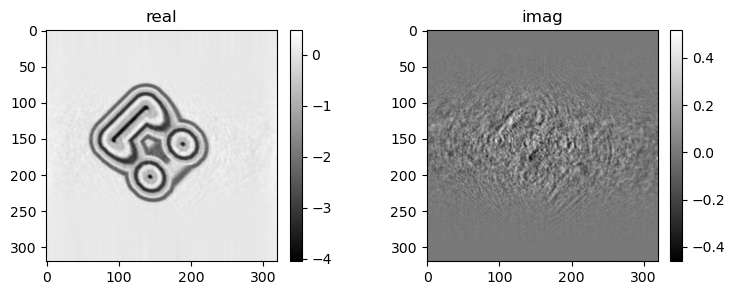

1633), float(gammah)=1.3396897315979004 err=1.08530e-04
1634), float(gammah)=1.3271583318710327 err=1.09004e-04
1635), float(gammah)=1.3963967561721802 err=1.09508e-04
1636), float(gammah)=1.3309690952301025 err=1.10007e-04
1637), float(gammah)=1.3454477787017822 err=1.10502e-04
1638), float(gammah)=1.3837813138961792 err=1.11013e-04
1639), float(gammah)=1.3279740810394287 err=1.11539e-04
1640), float(gammah)=1.3943687677383423 err=1.12075e-04
1641), float(gammah)=1.3442386388778687 err=1.12652e-04
1642), float(gammah)=1.3631415367126465 err=1.13219e-04
1643), float(gammah)=1.377519965171814 err=1.13822e-04
1644), float(gammah)=1.3449338674545288 err=1.14439e-04
1645), float(gammah)=1.353251576423645 err=1.15085e-04
1646), float(gammah)=1.3856016397476196 err=1.15681e-04
1647), float(gammah)=1.314453125 err=1.16293e-04
1648), float(gammah)=1.3867825269699097 err=1.16938e-04
1649), float(gammah)=1.342422366142273 err=1.17537e-04
1650), float(gammah)=1.3529340028762817 err=1.18156e-04
16

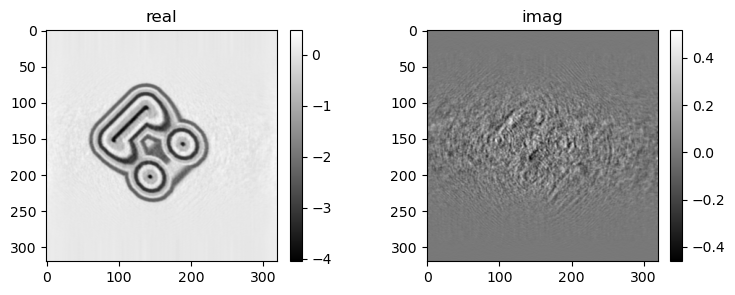

1665), float(gammah)=1.3621578216552734 err=1.28557e-04
1666), float(gammah)=1.3426944017410278 err=1.29329e-04
1667), float(gammah)=1.3579148054122925 err=1.30094e-04
1668), float(gammah)=1.3598477840423584 err=1.30900e-04
1669), float(gammah)=1.352790355682373 err=1.31693e-04
1670), float(gammah)=1.312864065170288 err=1.32451e-04
1671), float(gammah)=1.4031953811645508 err=1.33230e-04
1672), float(gammah)=1.2951419353485107 err=1.33973e-04
1673), float(gammah)=1.3848952054977417 err=1.34789e-04
1674), float(gammah)=1.346390724182129 err=1.35588e-04
1675), float(gammah)=1.3201451301574707 err=1.36339e-04
1676), float(gammah)=1.3799508810043335 err=1.37171e-04
1677), float(gammah)=1.3186043500900269 err=1.37935e-04
1678), float(gammah)=1.3231295347213745 err=1.38640e-04
1679), float(gammah)=1.3881168365478516 err=1.39388e-04
1680), float(gammah)=1.2891626358032227 err=1.40095e-04
1681), float(gammah)=1.368203043937683 err=1.40789e-04
1682), float(gammah)=1.3220444917678833 err=1.41442e

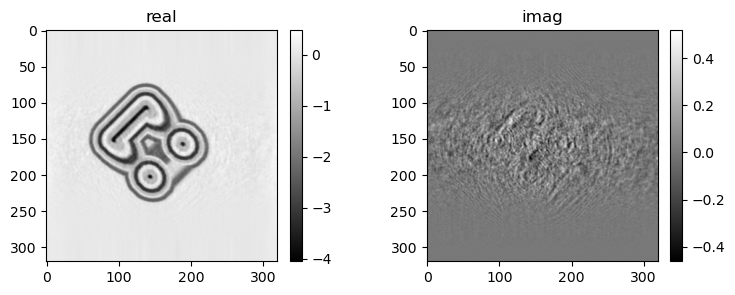

1697), float(gammah)=1.335434913635254 err=1.51823e-04
1698), float(gammah)=1.3399193286895752 err=1.52530e-04
1699), float(gammah)=1.3312145471572876 err=1.53211e-04
1700), float(gammah)=1.342525839805603 err=1.53975e-04
1701), float(gammah)=1.3283307552337646 err=1.54691e-04
1702), float(gammah)=1.3429274559020996 err=1.55385e-04
1703), float(gammah)=1.3261816501617432 err=1.56115e-04
1704), float(gammah)=1.3516069650650024 err=1.56868e-04
1705), float(gammah)=1.333616018295288 err=1.57608e-04
1706), float(gammah)=1.3339604139328003 err=1.58396e-04
1707), float(gammah)=1.3380956649780273 err=1.59179e-04
1708), float(gammah)=1.3136316537857056 err=1.59894e-04
1709), float(gammah)=1.3458510637283325 err=1.60659e-04
1710), float(gammah)=1.305915355682373 err=1.61371e-04
1711), float(gammah)=1.3364677429199219 err=1.62071e-04
1712), float(gammah)=1.3216979503631592 err=1.62830e-04
1713), float(gammah)=1.3432416915893555 err=1.63571e-04
1714), float(gammah)=1.3080997467041016 err=1.64304e

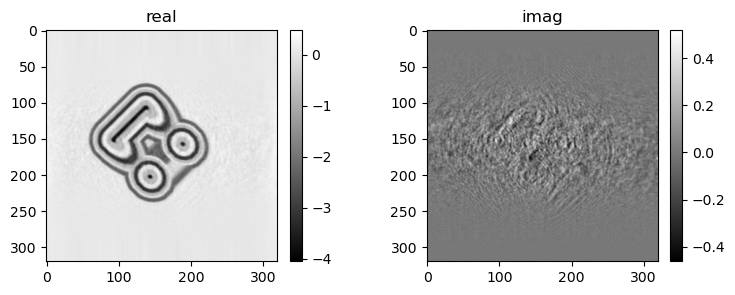

1729), float(gammah)=1.3099133968353271 err=1.76144e-04
1730), float(gammah)=1.3366098403930664 err=1.76962e-04
1731), float(gammah)=1.3354398012161255 err=1.77781e-04
1732), float(gammah)=1.319301724433899 err=1.78583e-04
1733), float(gammah)=1.3268409967422485 err=1.79385e-04
1734), float(gammah)=1.332414150238037 err=1.80183e-04
1735), float(gammah)=1.3357372283935547 err=1.80991e-04
1736), float(gammah)=1.3353636264801025 err=1.81880e-04
1737), float(gammah)=1.3461171388626099 err=1.82774e-04
1738), float(gammah)=1.3168500661849976 err=1.83647e-04
1739), float(gammah)=1.3786284923553467 err=1.84633e-04
1740), float(gammah)=1.3005883693695068 err=1.85607e-04
1741), float(gammah)=1.3547283411026 err=1.86548e-04
1742), float(gammah)=1.3058220148086548 err=1.87498e-04
1743), float(gammah)=1.3495652675628662 err=1.88501e-04
1744), float(gammah)=1.3318337202072144 err=1.89512e-04
1745), float(gammah)=1.3180683851242065 err=1.90478e-04
1746), float(gammah)=1.3294174671173096 err=1.91475e-

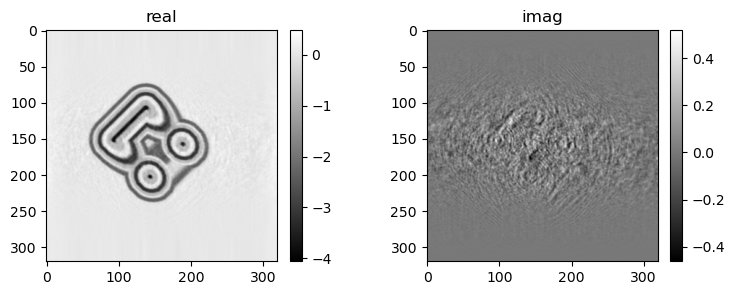

1761), float(gammah)=1.3224326372146606 err=2.06668e-04
1762), float(gammah)=1.3301461935043335 err=2.07832e-04
1763), float(gammah)=1.3258830308914185 err=2.08888e-04
1764), float(gammah)=1.3360083103179932 err=2.09986e-04
1765), float(gammah)=1.32091224193573 err=2.11071e-04
1766), float(gammah)=1.3316831588745117 err=2.12208e-04
1767), float(gammah)=1.343302607536316 err=2.13304e-04
1768), float(gammah)=1.3219265937805176 err=2.14432e-04
1769), float(gammah)=1.341524362564087 err=2.15615e-04
1770), float(gammah)=1.3209383487701416 err=2.16780e-04
1771), float(gammah)=1.3394094705581665 err=2.17941e-04
1772), float(gammah)=1.3490879535675049 err=2.19191e-04
1773), float(gammah)=1.309226155281067 err=2.20420e-04
1774), float(gammah)=1.3449385166168213 err=2.21630e-04
1775), float(gammah)=1.3370742797851562 err=2.22885e-04
1776), float(gammah)=1.316575050354004 err=2.24172e-04
1777), float(gammah)=1.3689202070236206 err=2.25489e-04
1778), float(gammah)=1.2976616621017456 err=2.26774e-0

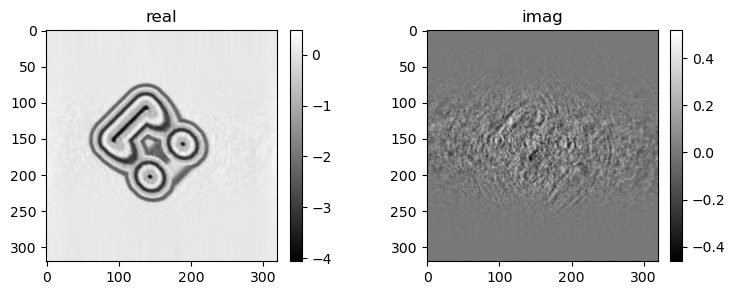

1793), float(gammah)=1.3371608257293701 err=2.48493e-04
1794), float(gammah)=1.324318766593933 err=2.50081e-04
1795), float(gammah)=1.3485625982284546 err=2.51712e-04
1796), float(gammah)=1.314183235168457 err=2.53304e-04
1797), float(gammah)=1.360185980796814 err=2.54921e-04
1798), float(gammah)=1.3147509098052979 err=2.56545e-04
1799), float(gammah)=1.3406211137771606 err=2.58247e-04
1800), float(gammah)=1.3492140769958496 err=2.59973e-04
1801), float(gammah)=1.3157280683517456 err=2.61665e-04
1802), float(gammah)=1.3585562705993652 err=2.63497e-04
1803), float(gammah)=1.3179312944412231 err=2.65232e-04
1804), float(gammah)=1.3296177387237549 err=2.67076e-04
1805), float(gammah)=1.363800048828125 err=2.68907e-04
1806), float(gammah)=1.3002506494522095 err=2.70767e-04
1807), float(gammah)=1.3684488534927368 err=2.72672e-04
1808), float(gammah)=1.320615530014038 err=2.74620e-04
1809), float(gammah)=1.308379888534546 err=2.76496e-04
1810), float(gammah)=1.3884868621826172 err=2.78422e-0

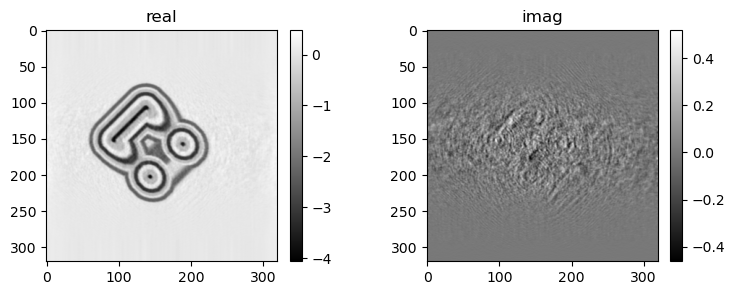

1825), float(gammah)=1.3566545248031616 err=3.08778e-04
1826), float(gammah)=1.3127225637435913 err=3.10777e-04
1827), float(gammah)=1.3574143648147583 err=3.12888e-04
1828), float(gammah)=1.327601671218872 err=3.14945e-04
1829), float(gammah)=1.3237429857254028 err=3.17032e-04
1830), float(gammah)=1.356874942779541 err=3.19177e-04
1831), float(gammah)=1.3117443323135376 err=3.21280e-04
1832), float(gammah)=1.3553986549377441 err=3.23480e-04
1833), float(gammah)=1.3207319974899292 err=3.25611e-04
1834), float(gammah)=1.34177827835083 err=3.27831e-04
1835), float(gammah)=1.3287827968597412 err=3.30051e-04
1836), float(gammah)=1.3452733755111694 err=3.32264e-04
1837), float(gammah)=1.3119362592697144 err=3.34480e-04
1838), float(gammah)=1.3674103021621704 err=3.36792e-04
1839), float(gammah)=1.2852715253829956 err=3.38969e-04
1840), float(gammah)=1.3708665370941162 err=3.41225e-04
1841), float(gammah)=1.3250296115875244 err=3.43577e-04
1842), float(gammah)=1.3109763860702515 err=3.45798e

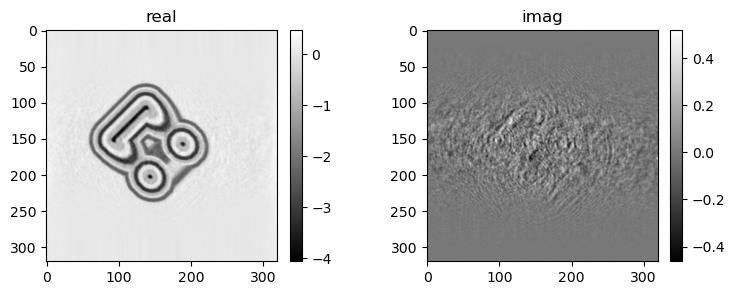

1857), float(gammah)=1.3123703002929688 err=3.81388e-04
1858), float(gammah)=1.3575929403305054 err=3.83772e-04
1859), float(gammah)=1.300488829612732 err=3.86180e-04
1860), float(gammah)=1.359584093093872 err=3.88646e-04
1861), float(gammah)=1.3198440074920654 err=3.91179e-04
1862), float(gammah)=1.3533004522323608 err=3.93729e-04
1863), float(gammah)=1.3142896890640259 err=3.96374e-04
1864), float(gammah)=1.3334399461746216 err=3.98912e-04
1865), float(gammah)=1.3470185995101929 err=4.01568e-04
1866), float(gammah)=1.3187404870986938 err=4.04190e-04
1867), float(gammah)=1.3268852233886719 err=4.06883e-04
1868), float(gammah)=1.3427019119262695 err=4.09537e-04
1869), float(gammah)=1.3249729871749878 err=4.12167e-04
1870), float(gammah)=1.3238805532455444 err=4.14918e-04
1871), float(gammah)=1.3693339824676514 err=4.17755e-04
1872), float(gammah)=1.291270136833191 err=4.20483e-04
1873), float(gammah)=1.3623491525650024 err=4.23330e-04
1874), float(gammah)=1.3425612449645996 err=4.26241

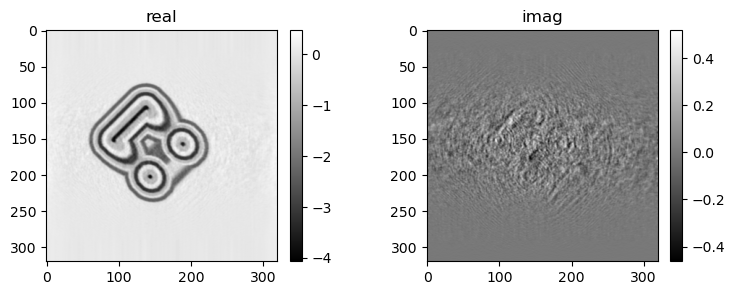

1889), float(gammah)=1.3325889110565186 err=4.70833e-04
1890), float(gammah)=1.324069857597351 err=4.73991e-04
1891), float(gammah)=1.350016713142395 err=4.77215e-04
1892), float(gammah)=1.3053334951400757 err=4.80291e-04
1893), float(gammah)=1.340083122253418 err=4.83497e-04
1894), float(gammah)=1.3429962396621704 err=4.86747e-04
1895), float(gammah)=1.3286826610565186 err=4.90079e-04
1896), float(gammah)=1.3340014219284058 err=4.93415e-04
1897), float(gammah)=1.3212214708328247 err=4.96758e-04
1898), float(gammah)=1.344881534576416 err=5.00160e-04
1899), float(gammah)=1.325118064880371 err=5.03657e-04
1900), float(gammah)=1.341674566268921 err=5.07238e-04
1901), float(gammah)=1.3197485208511353 err=5.10778e-04
1902), float(gammah)=1.34852135181427 err=5.14319e-04
1903), float(gammah)=1.3045127391815186 err=5.17908e-04
1904), float(gammah)=1.3704508543014526 err=5.21600e-04
1905), float(gammah)=1.2886558771133423 err=5.25136e-04
1906), float(gammah)=1.3750863075256348 err=5.28895e-04


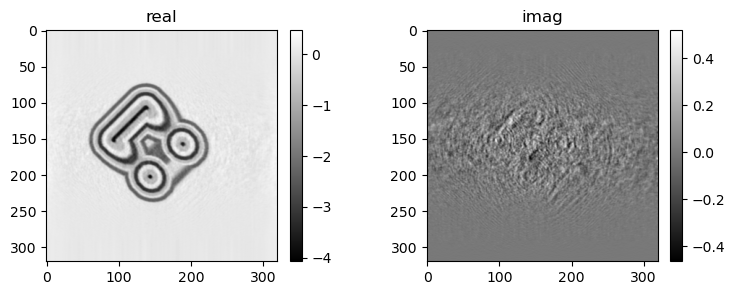

1921), float(gammah)=1.305798888206482 err=5.88151e-04
1922), float(gammah)=1.3673492670059204 err=5.92289e-04
1923), float(gammah)=1.2930448055267334 err=5.96428e-04
1924), float(gammah)=1.3572702407836914 err=6.00706e-04
1925), float(gammah)=1.3217169046401978 err=6.04882e-04
1926), float(gammah)=1.3378756046295166 err=6.09350e-04
1927), float(gammah)=1.3289248943328857 err=6.13643e-04
1928), float(gammah)=1.323960304260254 err=6.18046e-04
1929), float(gammah)=1.3390214443206787 err=6.22476e-04
1930), float(gammah)=1.3276698589324951 err=6.26887e-04
1931), float(gammah)=1.3237217664718628 err=6.31436e-04
1932), float(gammah)=1.3457664251327515 err=6.35985e-04
1933), float(gammah)=1.2940289974212646 err=6.40481e-04
1934), float(gammah)=1.3803186416625977 err=6.45158e-04
1935), float(gammah)=1.2810364961624146 err=6.49701e-04
1936), float(gammah)=1.3679094314575195 err=6.54611e-04
1937), float(gammah)=1.3170274496078491 err=6.59210e-04
1938), float(gammah)=1.305004358291626 err=6.63872

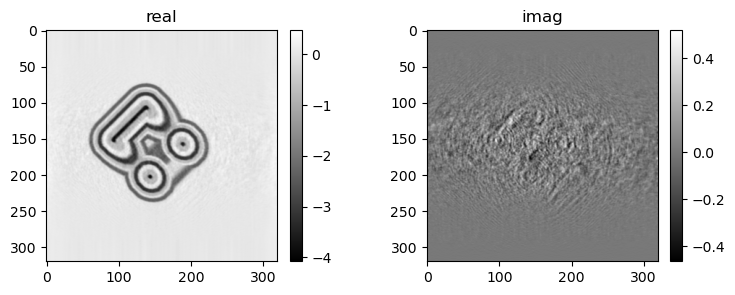

1953), float(gammah)=1.3276705741882324 err=7.42848e-04
1954), float(gammah)=1.3269531726837158 err=7.48523e-04
1955), float(gammah)=1.3592910766601562 err=7.54338e-04
1956), float(gammah)=1.2939364910125732 err=7.60107e-04
1957), float(gammah)=1.365470051765442 err=7.66079e-04
1958), float(gammah)=1.3114005327224731 err=7.71925e-04
1959), float(gammah)=1.344310998916626 err=7.78062e-04
1960), float(gammah)=1.3216718435287476 err=7.84043e-04
1961), float(gammah)=1.33451509475708 err=7.90025e-04
1962), float(gammah)=1.324313998222351 err=7.96245e-04
1963), float(gammah)=1.33100426197052 err=8.02333e-04
1964), float(gammah)=1.3378124237060547 err=8.08632e-04
1965), float(gammah)=1.3233168125152588 err=8.14851e-04
1966), float(gammah)=1.3211779594421387 err=8.21068e-04
1967), float(gammah)=1.3628277778625488 err=8.27655e-04
1968), float(gammah)=1.3055063486099243 err=8.34102e-04
1969), float(gammah)=1.3425184488296509 err=8.40800e-04
1970), float(gammah)=1.3461685180664062 err=8.47502e-04

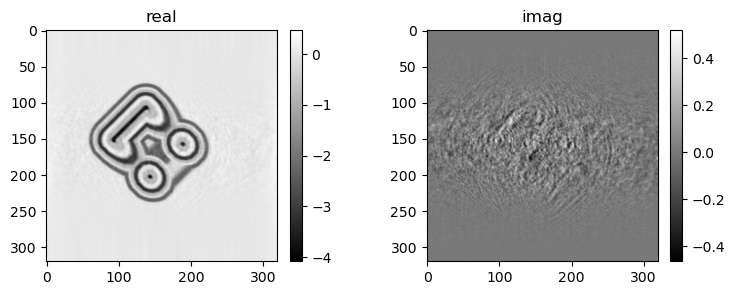

1985), float(gammah)=1.307949185371399 err=9.56070e-04
1986), float(gammah)=1.3720992803573608 err=9.64134e-04
1987), float(gammah)=1.2845289707183838 err=9.71995e-04
1988), float(gammah)=1.3822031021118164 err=9.80008e-04
1989), float(gammah)=1.2975915670394897 err=9.88107e-04
1990), float(gammah)=1.349166750907898 err=9.96487e-04
1991), float(gammah)=1.3370102643966675 err=1.00465e-03
1992), float(gammah)=1.3120626211166382 err=1.01308e-03
1993), float(gammah)=1.3532226085662842 err=1.02155e-03
1994), float(gammah)=1.3084772825241089 err=1.02994e-03
1995), float(gammah)=1.3526939153671265 err=1.03873e-03
1996), float(gammah)=1.317039966583252 err=1.04709e-03
1997), float(gammah)=1.3254175186157227 err=1.05582e-03
1998), float(gammah)=1.3387467861175537 err=1.06435e-03
1999), float(gammah)=1.3140708208084106 err=1.07297e-03
2000), float(gammah)=1.3582595586776733 err=1.08209e-03
2001), float(gammah)=1.3077185153961182 err=1.09099e-03
2002), float(gammah)=1.344043493270874 err=1.10027e

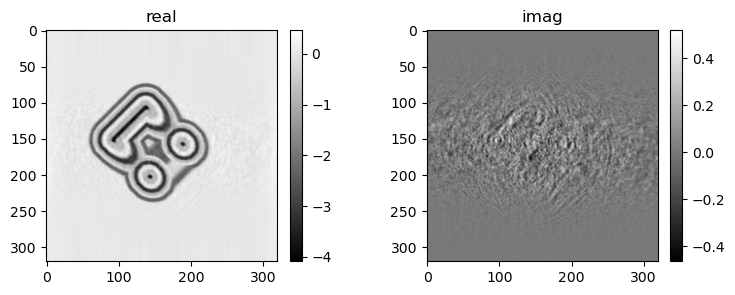

2017), float(gammah)=1.3283036947250366 err=1.25127e-03
2018), float(gammah)=1.3467047214508057 err=1.26213e-03
2019), float(gammah)=1.3145112991333008 err=1.27326e-03
2020), float(gammah)=1.3365803956985474 err=1.28427e-03
2021), float(gammah)=1.3346738815307617 err=1.29558e-03
2022), float(gammah)=1.3254951238632202 err=1.30692e-03
2023), float(gammah)=1.3339717388153076 err=1.31826e-03
2024), float(gammah)=1.3217288255691528 err=1.32968e-03
2025), float(gammah)=1.3456803560256958 err=1.34143e-03
2026), float(gammah)=1.3119248151779175 err=1.35318e-03
2027), float(gammah)=1.3579013347625732 err=1.36521e-03
2028), float(gammah)=1.30375075340271 err=1.37732e-03
2029), float(gammah)=1.3549309968948364 err=1.38957e-03
2030), float(gammah)=1.3277602195739746 err=1.40224e-03
2031), float(gammah)=1.3231146335601807 err=1.41502e-03
2032), float(gammah)=1.3401249647140503 err=1.42790e-03
2033), float(gammah)=1.3427668809890747 err=1.44134e-03
2034), float(gammah)=1.3346370458602905 err=1.4548

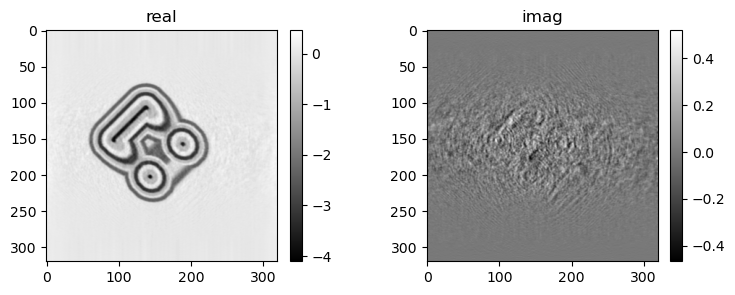

2049), float(gammah)=1.3609520196914673 err=1.68502e-03
2050), float(gammah)=1.3210257291793823 err=1.70231e-03
2051), float(gammah)=1.3370532989501953 err=1.71977e-03
2052), float(gammah)=1.343632698059082 err=1.73739e-03
2053), float(gammah)=1.3119932413101196 err=1.75527e-03
2054), float(gammah)=1.3751704692840576 err=1.77366e-03
2055), float(gammah)=1.2993899583816528 err=1.79226e-03
2056), float(gammah)=1.3701411485671997 err=1.81123e-03
2057), float(gammah)=1.314225673675537 err=1.83025e-03
2058), float(gammah)=1.3532240390777588 err=1.84991e-03
2059), float(gammah)=1.3061975240707397 err=1.86905e-03
2060), float(gammah)=1.358643889427185 err=1.88875e-03
2061), float(gammah)=1.3186824321746826 err=1.90863e-03
2062), float(gammah)=1.3522489070892334 err=1.92906e-03
2063), float(gammah)=1.3314120769500732 err=1.94976e-03
2064), float(gammah)=1.325587272644043 err=1.97055e-03
2065), float(gammah)=1.3529728651046753 err=1.99186e-03
2066), float(gammah)=1.3367586135864258 err=2.01380e

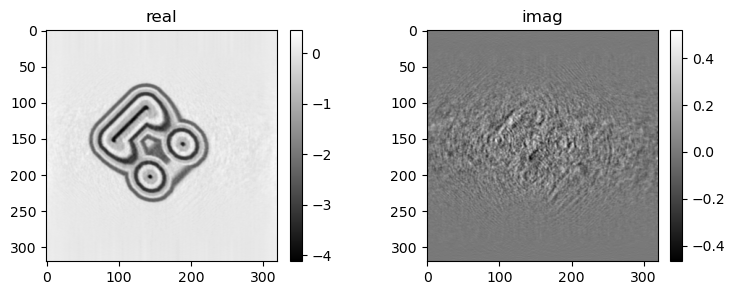

2081), float(gammah)=1.354858160018921 err=2.38238e-03
2082), float(gammah)=1.321247935295105 err=2.41006e-03
2083), float(gammah)=1.345611572265625 err=2.43830e-03
2084), float(gammah)=1.3306747674942017 err=2.46674e-03
2085), float(gammah)=1.3407307863235474 err=2.49566e-03
2086), float(gammah)=1.3275094032287598 err=2.52499e-03
2087), float(gammah)=1.352747917175293 err=2.55463e-03
2088), float(gammah)=1.3122954368591309 err=2.58433e-03
2089), float(gammah)=1.3458671569824219 err=2.61446e-03
2090), float(gammah)=1.3351186513900757 err=2.64497e-03
2091), float(gammah)=1.341410756111145 err=2.67633e-03
2092), float(gammah)=1.3243474960327148 err=2.70764e-03
2093), float(gammah)=1.3568145036697388 err=2.74002e-03
2094), float(gammah)=1.3103748559951782 err=2.77207e-03
2095), float(gammah)=1.3616725206375122 err=2.80549e-03
2096), float(gammah)=1.3298568725585938 err=2.83938e-03
2097), float(gammah)=1.3222142457962036 err=2.87314e-03
2098), float(gammah)=1.3710761070251465 err=2.90888e-

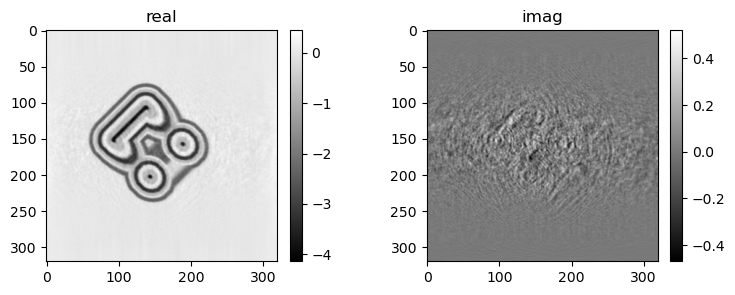

2113), float(gammah)=1.3180243968963623 err=3.50956e-03
2114), float(gammah)=1.353520393371582 err=3.55507e-03
2115), float(gammah)=1.3343960046768188 err=3.60158e-03
2116), float(gammah)=1.3420636653900146 err=3.64934e-03
2117), float(gammah)=1.3248405456542969 err=3.69649e-03
2118), float(gammah)=1.3575026988983154 err=3.74588e-03
2119), float(gammah)=1.3194472789764404 err=3.79473e-03
2120), float(gammah)=1.3624018430709839 err=3.84656e-03
2121), float(gammah)=1.3258222341537476 err=3.89786e-03
2122), float(gammah)=1.3337193727493286 err=3.95088e-03
2123), float(gammah)=1.3565268516540527 err=4.00445e-03
2124), float(gammah)=1.320842981338501 err=4.05924e-03
2125), float(gammah)=1.3482168912887573 err=4.11436e-03
2126), float(gammah)=1.3303788900375366 err=4.17018e-03
2127), float(gammah)=1.3406716585159302 err=4.22735e-03
2128), float(gammah)=1.3348731994628906 err=4.28492e-03
2129), float(gammah)=1.3465662002563477 err=4.34435e-03
2130), float(gammah)=1.318528175354004 err=4.40298

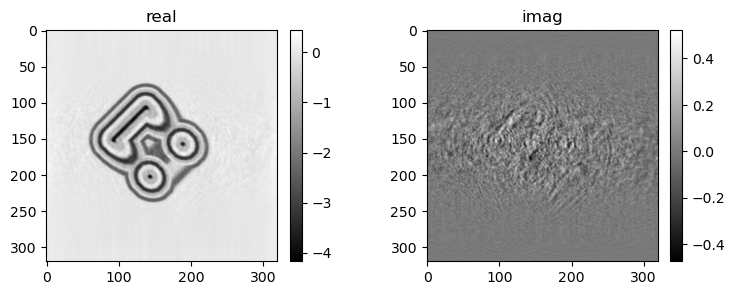

2145), float(gammah)=1.3125115633010864 err=5.44872e-03
2146), float(gammah)=1.348921775817871 err=5.53164e-03
2147), float(gammah)=1.3430345058441162 err=5.61363e-03
2148), float(gammah)=1.337498426437378 err=5.69919e-03
2149), float(gammah)=1.3331069946289062 err=5.78462e-03
2150), float(gammah)=1.3444827795028687 err=5.87151e-03
2151), float(gammah)=1.332320213317871 err=5.96009e-03
2152), float(gammah)=1.3439044952392578 err=6.05050e-03
2153), float(gammah)=1.3441228866577148 err=6.14252e-03
2154), float(gammah)=1.3342654705047607 err=6.23726e-03
2155), float(gammah)=1.3390001058578491 err=6.33158e-03
2156), float(gammah)=1.3487905263900757 err=6.43078e-03
2157), float(gammah)=1.325912356376648 err=6.52818e-03
2158), float(gammah)=1.3445371389389038 err=6.62863e-03
2159), float(gammah)=1.3397014141082764 err=6.73163e-03
2160), float(gammah)=1.3407195806503296 err=6.83484e-03
2161), float(gammah)=1.3351423740386963 err=6.94180e-03
2162), float(gammah)=1.358481526374817 err=7.05167e-

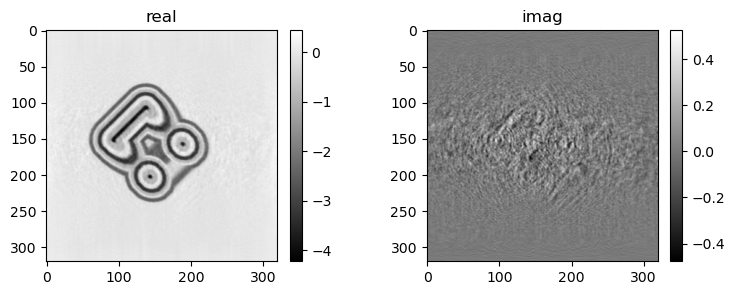

2177), float(gammah)=1.3711110353469849 err=8.94963e-03
2178), float(gammah)=1.3147470951080322 err=9.09612e-03
2179), float(gammah)=1.3395916223526 err=9.24532e-03
2180), float(gammah)=1.3579758405685425 err=9.39847e-03
2181), float(gammah)=1.3189435005187988 err=9.55411e-03
2182), float(gammah)=1.362896203994751 err=9.71492e-03
2183), float(gammah)=1.3138426542282104 err=9.87402e-03
2184), float(gammah)=1.3670438528060913 err=1.00428e-02
2185), float(gammah)=1.3128106594085693 err=1.02078e-02
2186), float(gammah)=1.3726224899291992 err=1.03836e-02
2187), float(gammah)=1.3121262788772583 err=1.05583e-02
2188), float(gammah)=1.3628730773925781 err=1.07371e-02
2189), float(gammah)=1.318804383277893 err=1.09212e-02
2190), float(gammah)=1.3688455820083618 err=1.11087e-02
2191), float(gammah)=1.3043900728225708 err=1.12959e-02
2192), float(gammah)=1.3760737180709839 err=1.14946e-02
2193), float(gammah)=1.3311734199523926 err=1.16926e-02
2194), float(gammah)=1.3249996900558472 err=1.18941e-

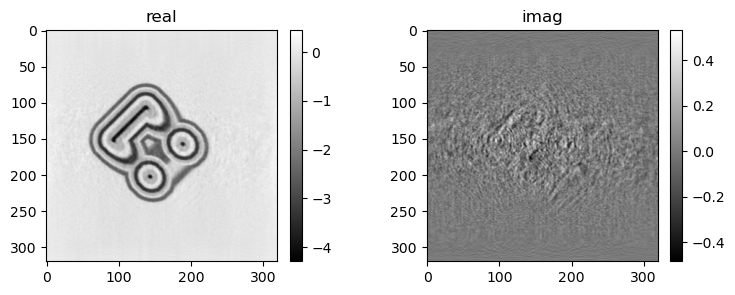

2209), float(gammah)=1.3220999240875244 err=1.54042e-02
2210), float(gammah)=1.3669768571853638 err=1.56698e-02
2211), float(gammah)=1.3267980813980103 err=1.59383e-02
2212), float(gammah)=1.3480712175369263 err=1.62154e-02
2213), float(gammah)=1.3283908367156982 err=1.64885e-02
2214), float(gammah)=1.3597612380981445 err=1.67749e-02
2215), float(gammah)=1.3132143020629883 err=1.70558e-02
2216), float(gammah)=1.3710412979125977 err=1.73481e-02
2217), float(gammah)=1.3055908679962158 err=1.76365e-02
2218), float(gammah)=1.3676749467849731 err=1.79324e-02
2219), float(gammah)=1.3264245986938477 err=1.82327e-02
2220), float(gammah)=1.3400527238845825 err=1.85348e-02
2221), float(gammah)=1.3456580638885498 err=1.88398e-02
2222), float(gammah)=1.347019910812378 err=1.91585e-02
2223), float(gammah)=1.3320761919021606 err=1.94725e-02
2224), float(gammah)=1.343062400817871 err=1.97929e-02
2225), float(gammah)=1.3317162990570068 err=2.01168e-02
2226), float(gammah)=1.3420219421386719 err=2.0442

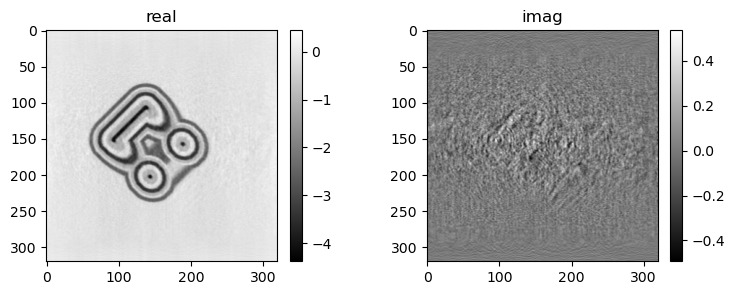

2241), float(gammah)=1.3984357118606567 err=2.57232e-02
2242), float(gammah)=1.2828832864761353 err=2.60845e-02
2243), float(gammah)=1.3843201398849487 err=2.64740e-02
2244), float(gammah)=1.311999797821045 err=2.68461e-02
2245), float(gammah)=1.3426564931869507 err=2.72315e-02
2246), float(gammah)=1.3365468978881836 err=2.76107e-02
2247), float(gammah)=1.3440955877304077 err=2.80029e-02
2248), float(gammah)=1.3217244148254395 err=2.83877e-02
2249), float(gammah)=1.3574832677841187 err=2.87817e-02
2250), float(gammah)=1.3165699243545532 err=2.91777e-02
2251), float(gammah)=1.36161208152771 err=2.95763e-02
2252), float(gammah)=1.3106496334075928 err=2.99749e-02
2253), float(gammah)=1.3497951030731201 err=3.03767e-02
2254), float(gammah)=1.3302854299545288 err=3.07766e-02
2255), float(gammah)=1.3399697542190552 err=3.11851e-02
2256), float(gammah)=1.3161444664001465 err=3.15857e-02
2257), float(gammah)=1.370766043663025 err=3.19973e-02
2258), float(gammah)=1.2912375926971436 err=3.24025e

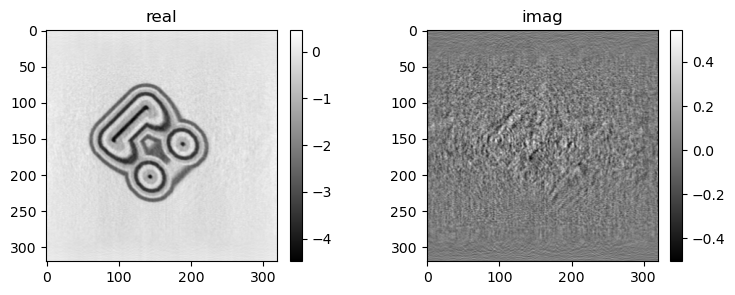

2273), float(gammah)=1.3239251375198364 err=3.87871e-02
2274), float(gammah)=1.3736742734909058 err=3.92354e-02
2275), float(gammah)=1.2982656955718994 err=3.96752e-02
2276), float(gammah)=1.3681364059448242 err=4.01281e-02
2277), float(gammah)=1.325872778892517 err=4.05816e-02
2278), float(gammah)=1.3369988203048706 err=4.10359e-02
2279), float(gammah)=1.3425076007843018 err=4.14963e-02
2280), float(gammah)=1.3346246480941772 err=4.19573e-02
2281), float(gammah)=1.3283053636550903 err=4.24182e-02
2282), float(gammah)=1.359866738319397 err=4.28881e-02
2283), float(gammah)=1.313116431236267 err=4.33573e-02
2284), float(gammah)=1.3746216297149658 err=4.38393e-02
2285), float(gammah)=1.304854154586792 err=4.43120e-02
2286), float(gammah)=1.371537685394287 err=4.48041e-02
2287), float(gammah)=1.3243767023086548 err=4.52886e-02
2288), float(gammah)=1.344762921333313 err=4.57868e-02
2289), float(gammah)=1.3212652206420898 err=4.62689e-02
2290), float(gammah)=1.3618440628051758 err=4.67737e-0

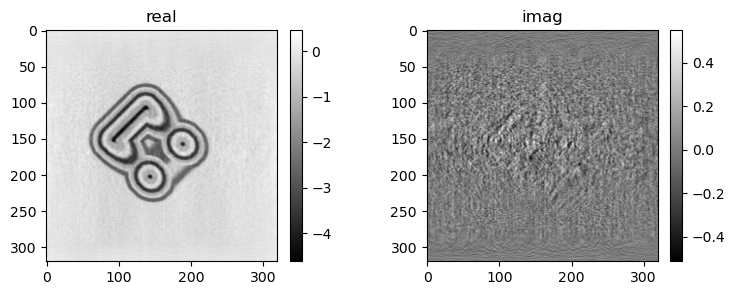

2305), float(gammah)=1.3260654211044312 err=5.45936e-02
2306), float(gammah)=1.365100383758545 err=5.51448e-02
2307), float(gammah)=1.3088043928146362 err=5.57021e-02
2308), float(gammah)=1.3719583749771118 err=5.62654e-02
2309), float(gammah)=1.3076101541519165 err=5.68216e-02
2310), float(gammah)=1.371597409248352 err=5.74065e-02
2311), float(gammah)=1.3068008422851562 err=5.79630e-02
2312), float(gammah)=1.3603949546813965 err=5.85504e-02
2313), float(gammah)=1.3274236917495728 err=5.91182e-02
2314), float(gammah)=1.3453816175460815 err=5.97111e-02
2315), float(gammah)=1.3618720769882202 err=6.03049e-02
2316), float(gammah)=1.2923152446746826 err=6.08909e-02
2317), float(gammah)=1.3960710763931274 err=6.14968e-02
2318), float(gammah)=1.319159984588623 err=6.21109e-02
2319), float(gammah)=1.333512306213379 err=6.27210e-02
2320), float(gammah)=1.3560792207717896 err=6.33361e-02
2321), float(gammah)=1.3272294998168945 err=6.39605e-02
2322), float(gammah)=1.3449305295944214 err=6.45767e

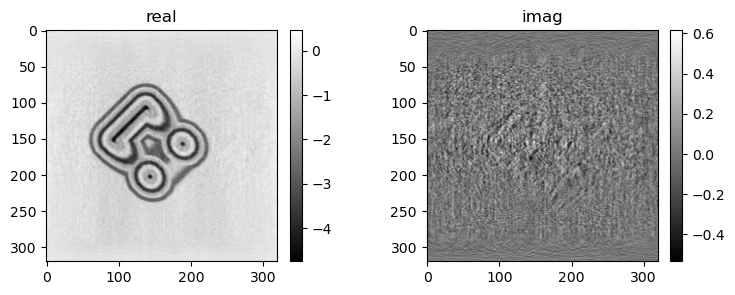

2337), float(gammah)=1.3410322666168213 err=7.43398e-02
2338), float(gammah)=1.3361761569976807 err=7.50173e-02
2339), float(gammah)=1.3446800708770752 err=7.57138e-02
2340), float(gammah)=1.337570071220398 err=7.64052e-02
2341), float(gammah)=1.3401920795440674 err=7.71044e-02
2342), float(gammah)=1.353330135345459 err=7.78216e-02
2343), float(gammah)=1.3267642259597778 err=7.85306e-02
2344), float(gammah)=1.3400403261184692 err=7.92415e-02
2345), float(gammah)=1.3522756099700928 err=7.99744e-02
2346), float(gammah)=1.3455168008804321 err=8.07032e-02
2347), float(gammah)=1.3295735120773315 err=8.14421e-02
2348), float(gammah)=1.3629024028778076 err=8.21924e-02
2349), float(gammah)=1.3242290019989014 err=8.29335e-02
2350), float(gammah)=1.3514635562896729 err=8.36936e-02
2351), float(gammah)=1.3531581163406372 err=8.44604e-02
2352), float(gammah)=1.3162343502044678 err=8.52112e-02
2353), float(gammah)=1.3807084560394287 err=8.60016e-02
2354), float(gammah)=1.309822678565979 err=8.67630

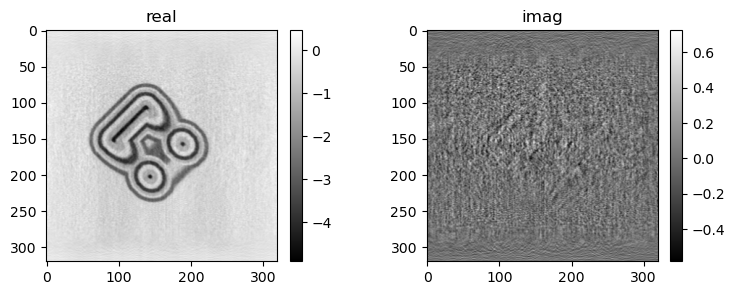

2369), float(gammah)=1.355127215385437 err=9.92725e-02
2370), float(gammah)=1.3390557765960693 err=1.00174e-01
2371), float(gammah)=1.336746335029602 err=1.01051e-01
2372), float(gammah)=1.3546799421310425 err=1.01952e-01
2373), float(gammah)=1.34090256690979 err=1.02851e-01
2374), float(gammah)=1.3467780351638794 err=1.03747e-01
2375), float(gammah)=1.340516448020935 err=1.04655e-01
2376), float(gammah)=1.3450493812561035 err=1.05560e-01
2377), float(gammah)=1.3417229652404785 err=1.06459e-01
2378), float(gammah)=1.3627508878707886 err=1.07398e-01
2379), float(gammah)=1.344827651977539 err=1.08330e-01
2380), float(gammah)=1.3384053707122803 err=1.09268e-01
2381), float(gammah)=1.348993182182312 err=1.10217e-01
2382), float(gammah)=1.3485990762710571 err=1.11165e-01
2383), float(gammah)=1.3618541955947876 err=1.12144e-01
2384), float(gammah)=1.3183051347732544 err=1.13101e-01
2385), float(gammah)=1.3837096691131592 err=1.14097e-01
2386), float(gammah)=1.3016486167907715 err=1.15045e-01

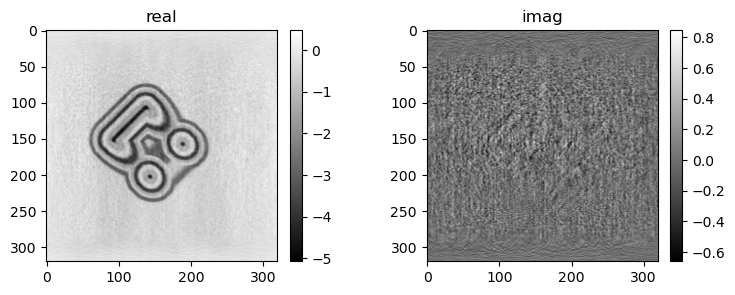

2401), float(gammah)=1.3498977422714233 err=1.30499e-01
2402), float(gammah)=1.3576709032058716 err=1.31589e-01
2403), float(gammah)=1.33608078956604 err=1.32675e-01
2404), float(gammah)=1.351401925086975 err=1.33761e-01
2405), float(gammah)=1.3631312847137451 err=1.34870e-01
2406), float(gammah)=1.3081965446472168 err=1.35946e-01
2407), float(gammah)=1.414161205291748 err=1.37094e-01
2408), float(gammah)=1.2986854314804077 err=1.38189e-01
2409), float(gammah)=1.377177357673645 err=1.39340e-01
2410), float(gammah)=1.343820571899414 err=1.40462e-01
2411), float(gammah)=1.3472179174423218 err=1.41616e-01
2412), float(gammah)=1.34787917137146 err=1.42756e-01
2413), float(gammah)=1.367457628250122 err=1.43938e-01
2414), float(gammah)=1.3313186168670654 err=1.45095e-01
2415), float(gammah)=1.3552271127700806 err=1.46274e-01
2416), float(gammah)=1.3507652282714844 err=1.47451e-01
2417), float(gammah)=1.3323174715042114 err=1.48620e-01
2418), float(gammah)=1.3722904920578003 err=1.49814e-01
2

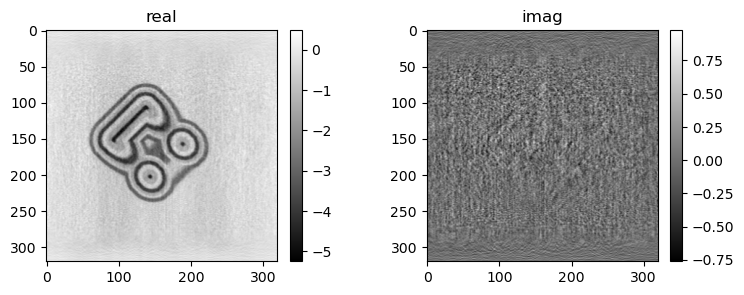

2433), float(gammah)=1.345832347869873 err=1.68690e-01
2434), float(gammah)=1.355610728263855 err=1.69997e-01
2435), float(gammah)=1.3541254997253418 err=1.71371e-01
2436), float(gammah)=1.3765829801559448 err=1.72728e-01
2437), float(gammah)=1.3070285320281982 err=1.74070e-01
2438), float(gammah)=1.4185386896133423 err=1.75485e-01
2439), float(gammah)=1.2832398414611816 err=1.76790e-01
2440), float(gammah)=1.4125244617462158 err=1.78224e-01
2441), float(gammah)=1.3335869312286377 err=1.79577e-01
2442), float(gammah)=1.3547155857086182 err=1.81005e-01
2443), float(gammah)=1.3769590854644775 err=1.82413e-01
2444), float(gammah)=1.3106439113616943 err=1.83812e-01
2445), float(gammah)=1.3894503116607666 err=1.85230e-01
2446), float(gammah)=1.3411577939987183 err=1.86654e-01
2447), float(gammah)=1.3533554077148438 err=1.88092e-01
2448), float(gammah)=1.3772708177566528 err=1.89556e-01
2449), float(gammah)=1.328009843826294 err=1.90994e-01
2450), float(gammah)=1.3700106143951416 err=1.92462

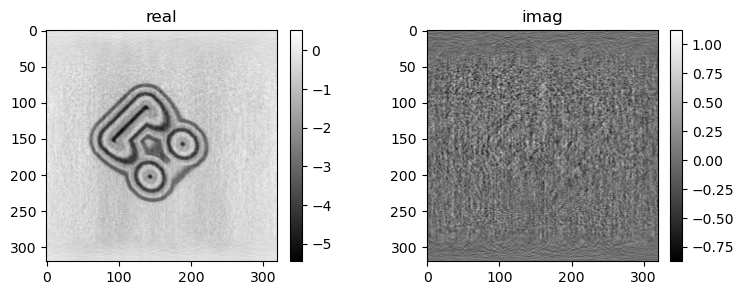

2465), float(gammah)=1.3505445718765259 err=2.15476e-01
2466), float(gammah)=1.343268632888794 err=2.17067e-01
2467), float(gammah)=1.3841700553894043 err=2.18665e-01
2468), float(gammah)=1.3150972127914429 err=2.20264e-01
2469), float(gammah)=1.4071754217147827 err=2.21918e-01
2470), float(gammah)=1.3232941627502441 err=2.23534e-01
2471), float(gammah)=1.3671205043792725 err=2.25203e-01
2472), float(gammah)=1.3566566705703735 err=2.26840e-01
2473), float(gammah)=1.3574628829956055 err=2.28520e-01
2474), float(gammah)=1.3480113744735718 err=2.30180e-01
2475), float(gammah)=1.3667576313018799 err=2.31866e-01
2476), float(gammah)=1.3523790836334229 err=2.33563e-01
2477), float(gammah)=1.357725977897644 err=2.35251e-01
2478), float(gammah)=1.3583340644836426 err=2.36973e-01
2479), float(gammah)=1.3525699377059937 err=2.38679e-01
2480), float(gammah)=1.3469923734664917 err=2.40368e-01
2481), float(gammah)=1.3854942321777344 err=2.42123e-01
2482), float(gammah)=1.3363621234893799 err=2.4385

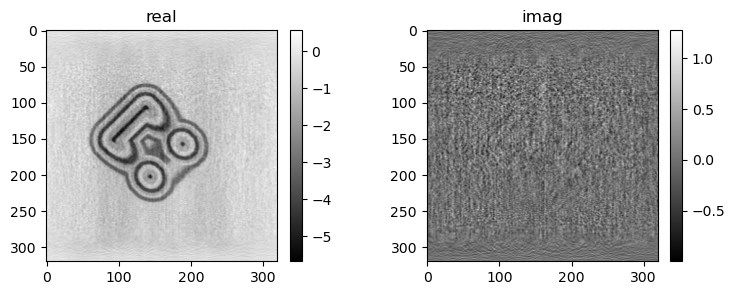

2497), float(gammah)=1.32420814037323 err=2.71163e-01
2498), float(gammah)=1.3929858207702637 err=2.73088e-01
2499), float(gammah)=1.3630895614624023 err=2.74944e-01
2500), float(gammah)=1.3474708795547485 err=2.76882e-01
2501), float(gammah)=1.3946739435195923 err=2.78802e-01
2502), float(gammah)=1.3445922136306763 err=2.80723e-01
2503), float(gammah)=1.3699216842651367 err=2.82685e-01
2504), float(gammah)=1.3622537851333618 err=2.84601e-01
2505), float(gammah)=1.3707811832427979 err=2.86580e-01
2506), float(gammah)=1.3715934753417969 err=2.88556e-01
2507), float(gammah)=1.3452324867248535 err=2.90523e-01
2508), float(gammah)=1.3929684162139893 err=2.92536e-01
2509), float(gammah)=1.3378163576126099 err=2.94500e-01
2510), float(gammah)=1.3851041793823242 err=2.96533e-01
2511), float(gammah)=1.3598415851593018 err=2.98546e-01
2512), float(gammah)=1.3545596599578857 err=3.00561e-01
2513), float(gammah)=1.3566428422927856 err=3.02564e-01
2514), float(gammah)=1.3838896751403809 err=3.0461

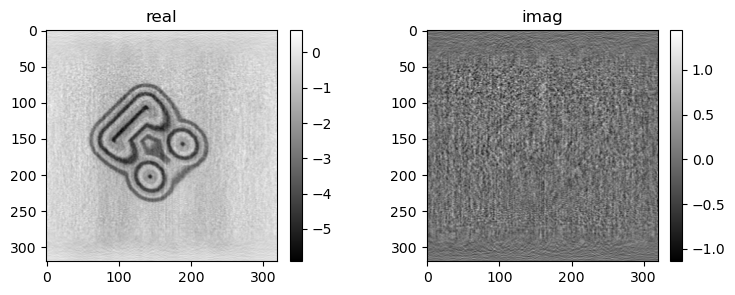

2529), float(gammah)=1.3828709125518799 err=3.35873e-01
2530), float(gammah)=1.3673714399337769 err=3.38020e-01
2531), float(gammah)=1.364465355873108 err=3.40190e-01
2532), float(gammah)=1.36837899684906 err=3.42379e-01
2533), float(gammah)=1.3692320585250854 err=3.44585e-01
2534), float(gammah)=1.3526196479797363 err=3.46741e-01
2535), float(gammah)=1.3761341571807861 err=3.48954e-01
2536), float(gammah)=1.3561280965805054 err=3.51115e-01
2537), float(gammah)=1.3917434215545654 err=3.53344e-01
2538), float(gammah)=1.3512647151947021 err=3.55559e-01
2539), float(gammah)=1.3732199668884277 err=3.57774e-01
2540), float(gammah)=1.3784940242767334 err=3.60015e-01
2541), float(gammah)=1.3654930591583252 err=3.62282e-01
2542), float(gammah)=1.3686537742614746 err=3.64541e-01
2543), float(gammah)=1.3779338598251343 err=3.66817e-01
2544), float(gammah)=1.344809889793396 err=3.69073e-01
2545), float(gammah)=1.4046318531036377 err=3.71349e-01
2546), float(gammah)=1.3448030948638916 err=3.73645e

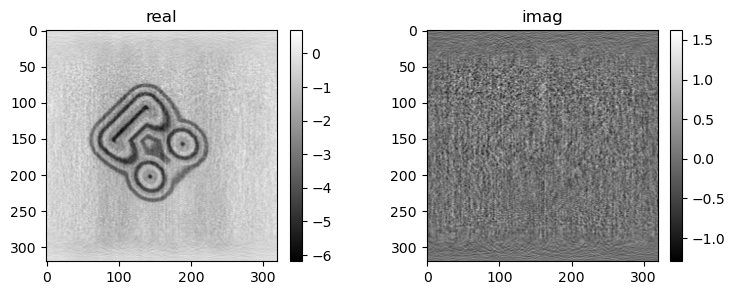

2561), float(gammah)=1.4064818620681763 err=4.08715e-01
2562), float(gammah)=1.3454439640045166 err=4.11081e-01
2563), float(gammah)=1.4115009307861328 err=4.13502e-01
2564), float(gammah)=1.3397034406661987 err=4.15839e-01
2565), float(gammah)=1.4082512855529785 err=4.18282e-01
2566), float(gammah)=1.3699018955230713 err=4.20638e-01
2567), float(gammah)=1.37700617313385 err=4.23077e-01
2568), float(gammah)=1.374819040298462 err=4.25468e-01
2569), float(gammah)=1.3876935243606567 err=4.27882e-01
2570), float(gammah)=1.3686954975128174 err=4.30286e-01
2571), float(gammah)=1.3918979167938232 err=4.32749e-01
2572), float(gammah)=1.391281008720398 err=4.35185e-01
2573), float(gammah)=1.3555121421813965 err=4.37614e-01
2574), float(gammah)=1.3884845972061157 err=4.40022e-01
2575), float(gammah)=1.395857572555542 err=4.42464e-01
2576), float(gammah)=1.3576754331588745 err=4.44890e-01
2577), float(gammah)=1.39717435836792 err=4.47319e-01
2578), float(gammah)=1.3743274211883545 err=4.49747e-01

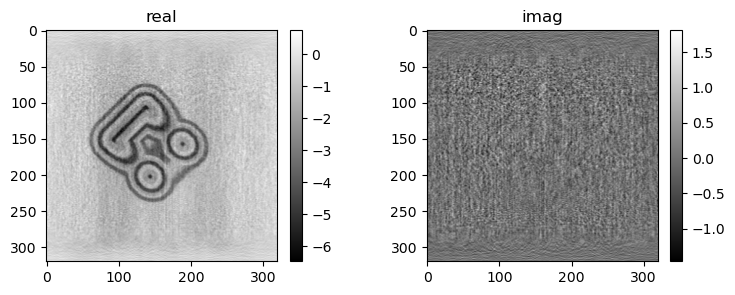

2593), float(gammah)=1.3737958669662476 err=4.86509e-01
2594), float(gammah)=1.3571627140045166 err=4.88968e-01
2595), float(gammah)=1.4233654737472534 err=4.91418e-01
2596), float(gammah)=1.3661844730377197 err=4.93819e-01
2597), float(gammah)=1.3818341493606567 err=4.96280e-01
2598), float(gammah)=1.4251391887664795 err=4.98743e-01
2599), float(gammah)=1.381597876548767 err=5.01224e-01
2600), float(gammah)=1.3819581270217896 err=5.03727e-01
2601), float(gammah)=1.4087796211242676 err=5.06221e-01
2602), float(gammah)=1.3617547750473022 err=5.08669e-01
2603), float(gammah)=1.3815199136734009 err=5.11118e-01
2604), float(gammah)=1.4003626108169556 err=5.13536e-01
2605), float(gammah)=1.3991984128952026 err=5.16032e-01
2606), float(gammah)=1.379449486732483 err=5.18442e-01
2607), float(gammah)=1.4058929681777954 err=5.20949e-01
2608), float(gammah)=1.3846019506454468 err=5.23407e-01
2609), float(gammah)=1.4031718969345093 err=5.25886e-01
2610), float(gammah)=1.3683172464370728 err=5.2829

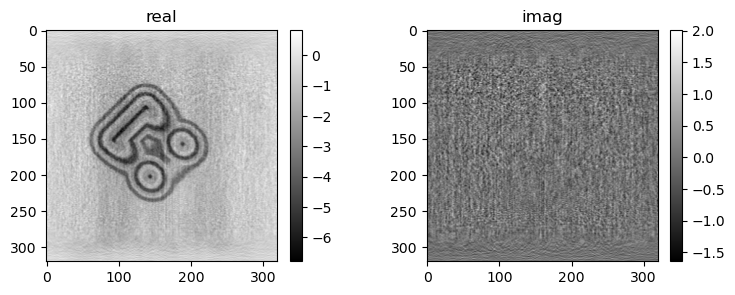

2625), float(gammah)=1.39072585105896 err=5.64660e-01
2626), float(gammah)=1.38102126121521 err=5.67027e-01
2627), float(gammah)=1.391250491142273 err=5.69392e-01
2628), float(gammah)=1.4267234802246094 err=5.71779e-01
2629), float(gammah)=1.3465248346328735 err=5.74112e-01
2630), float(gammah)=1.426316738128662 err=5.76472e-01
2631), float(gammah)=1.3983066082000732 err=5.78842e-01
2632), float(gammah)=1.3958184719085693 err=5.81229e-01
2633), float(gammah)=1.3908665180206299 err=5.83576e-01
2634), float(gammah)=1.4019044637680054 err=5.85925e-01
2635), float(gammah)=1.3831754922866821 err=5.88251e-01
2636), float(gammah)=1.4025734663009644 err=5.90537e-01
2637), float(gammah)=1.3730660676956177 err=5.92861e-01
2638), float(gammah)=1.4211913347244263 err=5.95169e-01
2639), float(gammah)=1.3790295124053955 err=5.97478e-01
2640), float(gammah)=1.40386164188385 err=5.99813e-01
2641), float(gammah)=1.3849618434906006 err=6.02062e-01
2642), float(gammah)=1.409806251525879 err=6.04387e-01
2

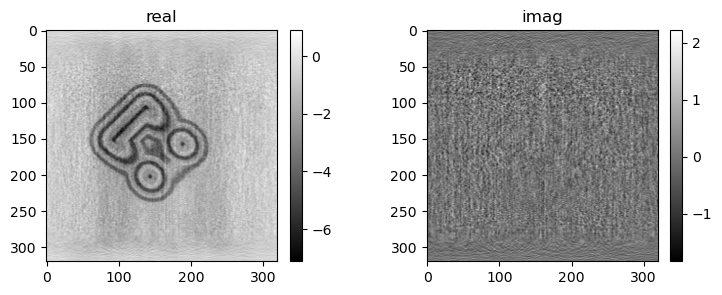

2657), float(gammah)=1.4550944566726685 err=6.37622e-01
2658), float(gammah)=1.3978267908096313 err=6.39758e-01
2659), float(gammah)=1.3544448614120483 err=6.41864e-01
2660), float(gammah)=1.4567638635635376 err=6.43978e-01
2661), float(gammah)=1.3730236291885376 err=6.46102e-01
2662), float(gammah)=1.416855812072754 err=6.48192e-01
2663), float(gammah)=1.3664580583572388 err=6.50219e-01
2664), float(gammah)=1.4196432828903198 err=6.52253e-01
2665), float(gammah)=1.4004102945327759 err=6.54275e-01
2666), float(gammah)=1.4352258443832397 err=6.56363e-01
2667), float(gammah)=1.354378342628479 err=6.58360e-01
2668), float(gammah)=1.4391897916793823 err=6.60415e-01
2669), float(gammah)=1.3892000913619995 err=6.62387e-01
2670), float(gammah)=1.376402497291565 err=6.64368e-01
2671), float(gammah)=1.4321722984313965 err=6.66347e-01
2672), float(gammah)=1.386852741241455 err=6.68270e-01
2673), float(gammah)=1.3783750534057617 err=6.70187e-01
2674), float(gammah)=1.4501067399978638 err=6.72153e

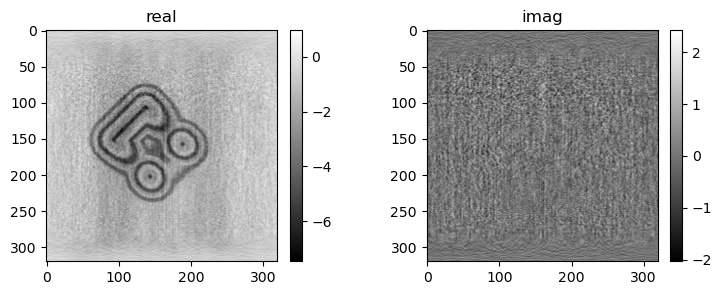

2689), float(gammah)=1.4100109338760376 err=6.98818e-01
2690), float(gammah)=1.4177054166793823 err=7.00445e-01
2691), float(gammah)=1.366605520248413 err=7.02067e-01
2692), float(gammah)=1.4553418159484863 err=7.03704e-01
2693), float(gammah)=1.3673721551895142 err=7.05294e-01
2694), float(gammah)=1.3970203399658203 err=7.06834e-01
2695), float(gammah)=1.4231764078140259 err=7.08411e-01
2696), float(gammah)=1.4103695154190063 err=7.09934e-01
2697), float(gammah)=1.3686574697494507 err=7.11428e-01
2698), float(gammah)=1.451373815536499 err=7.12991e-01
2699), float(gammah)=1.3814313411712646 err=7.14438e-01
2700), float(gammah)=1.381532907485962 err=7.15898e-01
2701), float(gammah)=1.4354138374328613 err=7.17355e-01
2702), float(gammah)=1.3799166679382324 err=7.18752e-01
2703), float(gammah)=1.424879789352417 err=7.20172e-01
2704), float(gammah)=1.3937088251113892 err=7.21571e-01
2705), float(gammah)=1.4145740270614624 err=7.22938e-01
2706), float(gammah)=1.3914929628372192 err=7.24270e

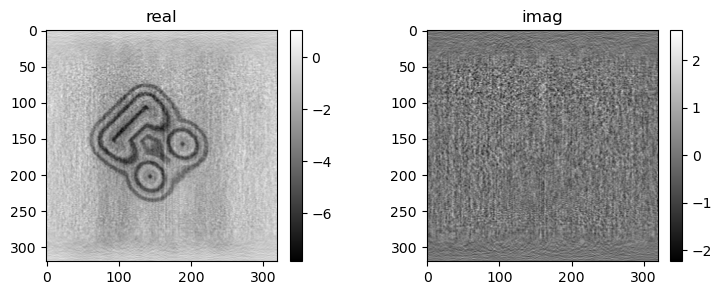

2721), float(gammah)=1.3910596370697021 err=7.41639e-01
2722), float(gammah)=1.4201806783676147 err=7.42629e-01
2723), float(gammah)=1.391303300857544 err=7.43571e-01
2724), float(gammah)=1.4183388948440552 err=7.44514e-01
2725), float(gammah)=1.3830970525741577 err=7.45411e-01
2726), float(gammah)=1.439833402633667 err=7.46305e-01
2727), float(gammah)=1.3819812536239624 err=7.47147e-01
2728), float(gammah)=1.3954682350158691 err=7.47993e-01
2729), float(gammah)=1.4630601406097412 err=7.48808e-01
2730), float(gammah)=1.3321043252944946 err=7.49576e-01
2731), float(gammah)=1.4491167068481445 err=7.50324e-01
2732), float(gammah)=1.3775486946105957 err=7.51031e-01
2733), float(gammah)=1.438437819480896 err=7.51738e-01
2734), float(gammah)=1.3874088525772095 err=7.52404e-01
2735), float(gammah)=1.4295417070388794 err=7.53067e-01
2736), float(gammah)=1.3973568677902222 err=7.53698e-01
2737), float(gammah)=1.3958609104156494 err=7.54298e-01
2738), float(gammah)=1.4110229015350342 err=7.54878

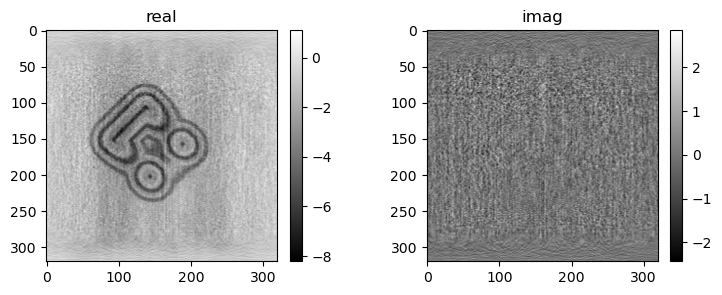

2753), float(gammah)=1.433085560798645 err=7.60554e-01
2754), float(gammah)=1.3843011856079102 err=7.60728e-01
2755), float(gammah)=1.3779587745666504 err=7.60875e-01
2756), float(gammah)=1.4521498680114746 err=7.60999e-01
2757), float(gammah)=1.353804111480713 err=7.61099e-01
2758), float(gammah)=1.41844642162323 err=7.61170e-01
2759), float(gammah)=1.3915997743606567 err=7.61216e-01
2760), float(gammah)=1.3865206241607666 err=7.61242e-01
2761), float(gammah)=1.4334588050842285 err=7.61236e-01
2762), float(gammah)=1.3498204946517944 err=7.61209e-01
2763), float(gammah)=1.4472306966781616 err=7.61157e-01
2764), float(gammah)=1.356025218963623 err=7.61079e-01
2765), float(gammah)=1.4075815677642822 err=7.60974e-01
2766), float(gammah)=1.4136372804641724 err=7.60846e-01
2767), float(gammah)=1.3561712503433228 err=7.60685e-01
2768), float(gammah)=1.4304664134979248 err=7.60508e-01
2769), float(gammah)=1.3973721265792847 err=7.60303e-01
2770), float(gammah)=1.3717581033706665 err=7.60074e-

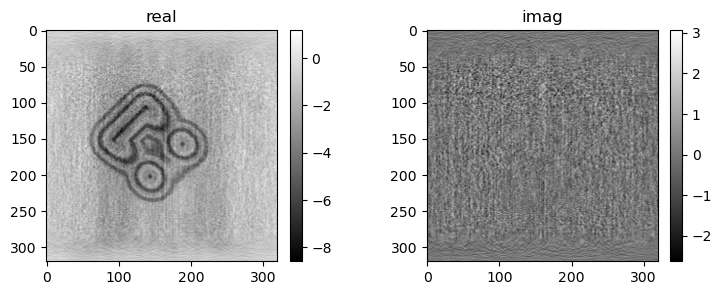

2785), float(gammah)=1.4078307151794434 err=7.53756e-01
2786), float(gammah)=1.3872995376586914 err=7.53137e-01
2787), float(gammah)=1.4077869653701782 err=7.52503e-01
2788), float(gammah)=1.3773174285888672 err=7.51827e-01
2789), float(gammah)=1.3799537420272827 err=7.51141e-01
2790), float(gammah)=1.4109828472137451 err=7.50429e-01
2791), float(gammah)=1.3708741664886475 err=7.49705e-01
2792), float(gammah)=1.3883321285247803 err=7.48944e-01
2793), float(gammah)=1.4242849349975586 err=7.48152e-01
2794), float(gammah)=1.3594454526901245 err=7.47358e-01
2795), float(gammah)=1.3986395597457886 err=7.46524e-01
2796), float(gammah)=1.4198391437530518 err=7.45665e-01
2797), float(gammah)=1.363754391670227 err=7.44793e-01
2798), float(gammah)=1.4083595275878906 err=7.43907e-01
2799), float(gammah)=1.394136667251587 err=7.42988e-01
2800), float(gammah)=1.3901420831680298 err=7.42062e-01
2801), float(gammah)=1.4198119640350342 err=7.41099e-01
2802), float(gammah)=1.359285593032837 err=7.40127

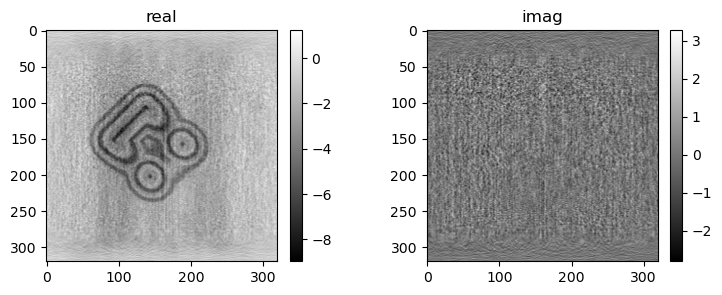

2817), float(gammah)=1.4097280502319336 err=7.22894e-01
2818), float(gammah)=1.3622081279754639 err=7.21604e-01
2819), float(gammah)=1.4294228553771973 err=7.20242e-01
2820), float(gammah)=1.3977185487747192 err=7.18887e-01
2821), float(gammah)=1.3626632690429688 err=7.17490e-01
2822), float(gammah)=1.397807240486145 err=7.16127e-01
2823), float(gammah)=1.3955724239349365 err=7.14683e-01
2824), float(gammah)=1.3689178228378296 err=7.13289e-01
2825), float(gammah)=1.3961679935455322 err=7.11802e-01
2826), float(gammah)=1.3938349485397339 err=7.10356e-01
2827), float(gammah)=1.3840587139129639 err=7.08841e-01
2828), float(gammah)=1.4133796691894531 err=7.07309e-01
2829), float(gammah)=1.3702141046524048 err=7.05776e-01
2830), float(gammah)=1.3946630954742432 err=7.04226e-01
2831), float(gammah)=1.413467526435852 err=7.02632e-01
2832), float(gammah)=1.3695757389068604 err=7.01051e-01
2833), float(gammah)=1.4083565473556519 err=6.99417e-01
2834), float(gammah)=1.397887945175171 err=6.97787

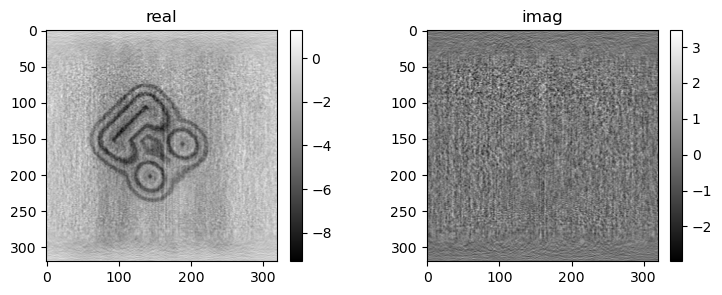

2849), float(gammah)=1.4067533016204834 err=6.71474e-01
2850), float(gammah)=1.397469162940979 err=6.69612e-01
2851), float(gammah)=1.387155294418335 err=6.67719e-01
2852), float(gammah)=1.3952834606170654 err=6.65796e-01
2853), float(gammah)=1.4067164659500122 err=6.63868e-01
2854), float(gammah)=1.352433681488037 err=6.61979e-01
2855), float(gammah)=1.417763352394104 err=6.60019e-01
2856), float(gammah)=1.3658732175827026 err=6.58094e-01
2857), float(gammah)=1.4139221906661987 err=6.56152e-01
2858), float(gammah)=1.3751875162124634 err=6.54209e-01
2859), float(gammah)=1.3899626731872559 err=6.52229e-01
2860), float(gammah)=1.4156599044799805 err=6.50200e-01
2861), float(gammah)=1.3282742500305176 err=6.48251e-01
2862), float(gammah)=1.4179927110671997 err=6.46221e-01
2863), float(gammah)=1.407448172569275 err=6.44202e-01
2864), float(gammah)=1.3533802032470703 err=6.42187e-01
2865), float(gammah)=1.4323313236236572 err=6.40074e-01
2866), float(gammah)=1.3762290477752686 err=6.38016e-

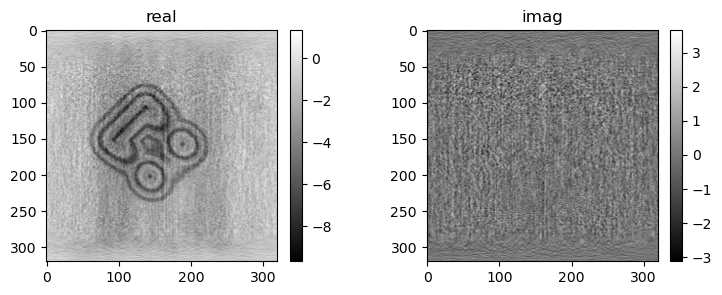

2881), float(gammah)=1.397547721862793 err=6.06111e-01
2882), float(gammah)=1.3918545246124268 err=6.03916e-01
2883), float(gammah)=1.3683816194534302 err=6.01743e-01
2884), float(gammah)=1.4041706323623657 err=5.99568e-01
2885), float(gammah)=1.3593136072158813 err=5.97408e-01
2886), float(gammah)=1.4152313470840454 err=5.95204e-01
2887), float(gammah)=1.3769997358322144 err=5.93015e-01
2888), float(gammah)=1.369602918624878 err=5.90808e-01
2889), float(gammah)=1.4117043018341064 err=5.88588e-01
2890), float(gammah)=1.381520390510559 err=5.86352e-01
2891), float(gammah)=1.372404932975769 err=5.84139e-01
2892), float(gammah)=1.4024475812911987 err=5.81887e-01
2893), float(gammah)=1.3819873332977295 err=5.79635e-01
2894), float(gammah)=1.3849232196807861 err=5.77384e-01
2895), float(gammah)=1.3956830501556396 err=5.75130e-01
2896), float(gammah)=1.3754727840423584 err=5.72901e-01
2897), float(gammah)=1.3806934356689453 err=5.70690e-01
2898), float(gammah)=1.392266869544983 err=5.68440e-

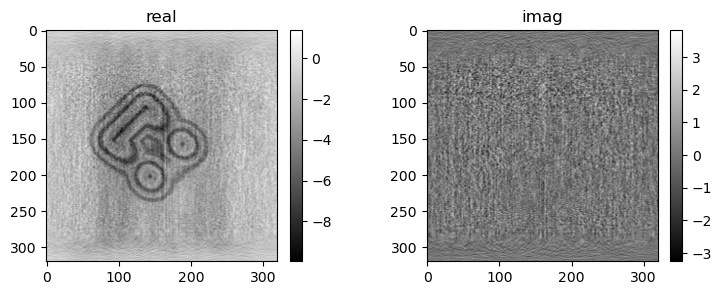

2913), float(gammah)=1.3721611499786377 err=5.34005e-01
2914), float(gammah)=1.3625363111495972 err=5.31689e-01
2915), float(gammah)=1.364255428314209 err=5.29403e-01
2916), float(gammah)=1.3813563585281372 err=5.27097e-01
2917), float(gammah)=1.3665894269943237 err=5.24809e-01
2918), float(gammah)=1.3315660953521729 err=5.22532e-01
2919), float(gammah)=1.4100772142410278 err=5.20188e-01
2920), float(gammah)=1.3204678297042847 err=5.17922e-01
2921), float(gammah)=1.3736658096313477 err=5.15560e-01
2922), float(gammah)=1.4291844367980957 err=5.13173e-01
2923), float(gammah)=1.2963041067123413 err=5.10850e-01
2924), float(gammah)=1.4223408699035645 err=5.08459e-01
2925), float(gammah)=1.325750708580017 err=5.06140e-01
2926), float(gammah)=1.3770666122436523 err=5.03808e-01
2927), float(gammah)=1.346594214439392 err=5.01492e-01
2928), float(gammah)=1.3787074089050293 err=4.99179e-01
2929), float(gammah)=1.3386085033416748 err=4.96885e-01
2930), float(gammah)=1.3744332790374756 err=4.94583

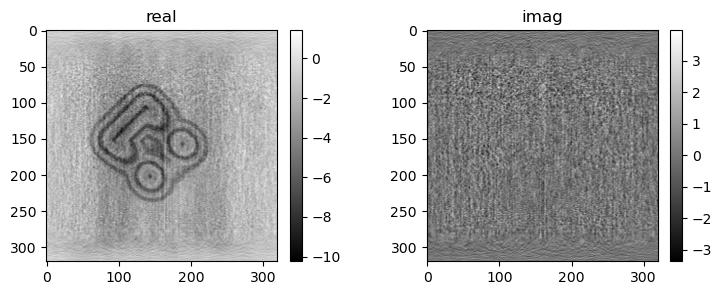

2945), float(gammah)=1.3800846338272095 err=4.60063e-01
2946), float(gammah)=1.3301199674606323 err=4.57841e-01
2947), float(gammah)=1.3623285293579102 err=4.55570e-01
2948), float(gammah)=1.3695815801620483 err=4.53331e-01
2949), float(gammah)=1.3254276514053345 err=4.51076e-01
2950), float(gammah)=1.3734644651412964 err=4.48852e-01
2951), float(gammah)=1.3284047842025757 err=4.46649e-01
2952), float(gammah)=1.3840667009353638 err=4.44368e-01
2953), float(gammah)=1.3237826824188232 err=4.42174e-01
2954), float(gammah)=1.3878475427627563 err=4.39854e-01
2955), float(gammah)=1.343093991279602 err=4.37598e-01
2956), float(gammah)=1.338274359703064 err=4.35335e-01
2957), float(gammah)=1.3821622133255005 err=4.33070e-01
2958), float(gammah)=1.3151779174804688 err=4.30860e-01
2959), float(gammah)=1.3711785078048706 err=4.28634e-01
2960), float(gammah)=1.3258581161499023 err=4.26440e-01
2961), float(gammah)=1.3954129219055176 err=4.24209e-01
2962), float(gammah)=1.3178777694702148 err=4.2204

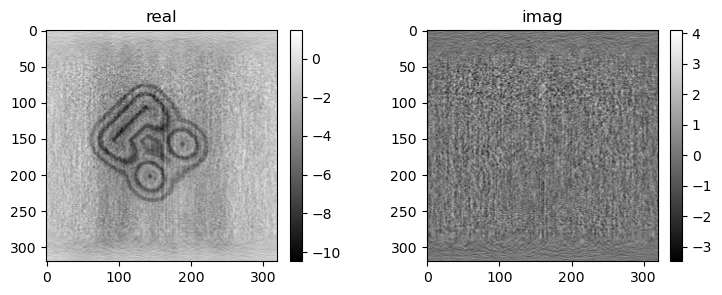

2977), float(gammah)=1.335304856300354 err=3.89707e-01
2978), float(gammah)=1.3461946249008179 err=3.87560e-01
2979), float(gammah)=1.3870339393615723 err=3.85409e-01
2980), float(gammah)=1.2878634929656982 err=3.83316e-01
2981), float(gammah)=1.3723278045654297 err=3.81206e-01
2982), float(gammah)=1.3130285739898682 err=3.79154e-01
2983), float(gammah)=1.365053415298462 err=3.77130e-01
2984), float(gammah)=1.3315314054489136 err=3.75082e-01
2985), float(gammah)=1.378631591796875 err=3.73028e-01
2986), float(gammah)=1.3357932567596436 err=3.70979e-01
2987), float(gammah)=1.3780317306518555 err=3.68878e-01
2988), float(gammah)=1.3241459131240845 err=3.66764e-01
2989), float(gammah)=1.3802794218063354 err=3.64658e-01
2990), float(gammah)=1.2883340120315552 err=3.62636e-01
2991), float(gammah)=1.366983413696289 err=3.60569e-01
2992), float(gammah)=1.336242437362671 err=3.58589e-01
2993), float(gammah)=1.3254966735839844 err=3.56561e-01
2994), float(gammah)=1.3549724817276 err=3.54580e-01


: 

In [11]:
def hessian2(psi,ksi,eta,prb,data):
    Lksi = fwd_holo(ksi,prb)
    Leta = fwd_holo(eta,prb)
    Lpsi = fwd_holo(psi,prb)        

    v1 = cp.abs(Lpsi)-data
    v2 = cp.real(cp.conj(Lksi)*Leta)/cp.abs(Lpsi)            
    v3 = cp.real(cp.conj(Lpsi)*Lksi) * cp.real(cp.conj(Lpsi)*Leta) / cp.abs(Lpsi)**3    
    v4 = cp.real(cp.conj(Lpsi)*Lksi)/cp.abs(Lpsi)
    v5 = cp.real(cp.conj(Lpsi)*Leta)/cp.abs(Lpsi)
    return 2*(cp.sum(v1 * cp.conj(v2-v3)) + cp.sum(v4*cp.conj(v5)))


def cg(data, init_u, prb, pars):
    def minf(fpsi):
        f = np.linalg.norm(np.abs(fpsi)-data)**2
        return f

    data = np.sqrt(data)
    u = init_u.copy()    
    conv = np.zeros(pars['niter'])
    step = np.zeros(pars['niter'])    
    center_pad = u.shape[-1]//2
    for i in range(pars['niter']):
        
        # \nabla(F)_X
        eR = cp.exp(1j*R(u,theta,center_pad).swapaxes(0,1))
        Lpsi = fwd_holo(eR,prb)        
        gradx = 2*adj_holo(Lpsi-data*np.exp(1j*np.angle(Lpsi)),prb)        
               
        # \nabla(G)_U0
        grad = cp.conj(eR)*gradx
        grad = -1j*RT(grad.swapaxes(0,1),theta,center_pad)                                
        
        Rgrad = R(grad,theta,center_pad).swapaxes(0,1)
        
        # eta
        if i == 0:
            eta = -grad            
            Reta = -Rgrad
        else:                     
        
            h2u = cp.real(cp.sum(gradx*cp.conj(eR*(1j*Rgrad)*(1j*Reta))))         
            h2u += hessian2(eR,eR*(1j*Rgrad),eR*(1j*Reta),prb,data)

            h2b = cp.real(cp.sum(gradx*cp.conj(eR*(1j*Reta)*(1j*Reta))))         
            h2b += hessian2(eR,eR*(1j*Reta),eR*(1j*Reta),prb,data)

            beta = h2u/h2b
            
            eta = -grad + beta*eta
            Reta = -Rgrad + beta*Reta  

        # hessian
        
        h2 = cp.real(cp.sum(gradx*cp.conj(eR*(1j*Reta)**2)))         
        h2 += hessian2(eR,eR*(1j*Reta),eR*(1j*Reta),prb,data)
                
        gammah = -cp.sum(cp.real(grad*cp.conj(eta)))/h2
        u += gammah*eta
        
        if i % pars['err_step'] == 0:
            eR = cp.exp(1j*R(u,theta,u.shape[-1]//2).swapaxes(0,1))
            Lpsi = fwd_holo(eR,prb)
            err = minf(Lpsi)
            conv[i] = err
            step[i] = gammah
            print(f'{i}), {float(gammah)=} {err=:1.5e}')

        if i % pars['vis_step'] == 0:
            mshow_complex(u[:,ne//2+3,:],show)            
            
    return u,conv,step
psirec = cp.pad(cp.array(recMultiPaganin),((0,0),(ne//2-n//2,ne//2-n//2),(ne//2-n//2,ne//2-n//2)),'edge')

#tomo initial guess
xi = 1/1j*cp.log(psirec).swapaxes(0,1)


urec = cp.zeros([ne,ne,ne],dtype='complex64')
pars = {'titer':65, 'gammau':0.5}
urec = cg_tomo(xi,urec,pars)

data = cp.array(data00)
rec_prb = cp.array(np.load(f'/data2/vnikitin/coded_apertures_new3/data/prb_{flg}.npy'))
shifts_code = cp.array(shifts_code)
pars = {'niter': 3000, 'err_step': 1, 'vis_step': 32}

urec,conv,step = cg(data, urec,rec_prb, pars)



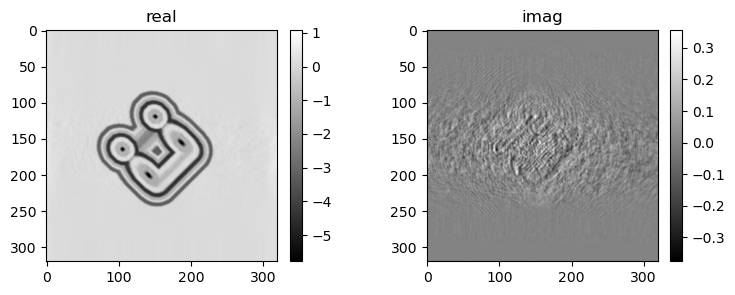

: 

In [12]:
# k = f'gradhessians2'
# np.save(f'data/u_{k}_{pars['niter']}',urec.get())
# np.save(f'data/conv_{k}',conv)
# np.save(f'data/step_{k}',step)
# mshow_complex(urec[:,128],show)